# Object Detection using TAO EfficientDet

Transfer learning is the process of transferring learned features from one application to another. It is a commonly used training technique where you use a model trained on one task and re-train to use it on a different task. 

Train Adapt Optimize (TAO) Toolkit  is a simple and easy-to-use Python based AI toolkit for taking purpose-built AI models and customizing them with users' own data.

<img align="center" src="https://developer.nvidia.com/sites/default/files/akamai/embedded-transfer-learning-toolkit-software-stack-1200x670px.png" width="1080">


## Learning Objectives
In this notebook, you will learn how to leverage the simplicity and convenience of TAO to:

* Take a pretrained model and train a EfficientDet-D0 modelon the Custom(Raccoon) COCO dataset
* Evaluate the trained model
* Run pruning and finetuning with the trained model
* Run inference with the trained model and visualize the result
* Export the trained model to a .etlt file for deployment to DeepStream
* Run inference on the exported .etlt model to verify deployment using TensorRT

## Table of Contents

This notebook shows an example use case of YOLO v4 Tiny object detection using Train Adapt Optimize (TAO) Toolkit.

0. [Set up env variables and map drives](#head-0)
1. [Install the TAO launcher](#head-1)
2. [Prepare dataset and pre-trained model](#head-2) <br>
     2.1 [Prepare dataset](#head-2-1)<br>
     2.2 [Download pretrained model](#head-2-2)
3. [Provide training specification](#head-3)
4. [Run TAO training](#head-4)
5. [Evaluate trained models](#head-5)
6. [Prune trained model](#head-6)
7. [Retrain pruned models](#head-7)
8. [Evaluate retrained model](#head-8)
9. [Visualize inferences](#head-9)
10. [Deploy](#head-10)
11. [Verify the deployed model](#head-11)

## 0. Set up env variables and map drives <a class="anchor" id="head-0"></a>

When using the purpose-built pretrained models from NGC, please make sure to set the `$KEY` environment variable to the key as mentioned in the model overview. Failing to do so, can lead to errors when trying to load them as pretrained models.

The following notebook requires the user to set an env variable called the `$LOCAL_PROJECT_DIR` as the path to the users workspace. Please note that the dataset to run this notebook is expected to reside in the `$LOCAL_PROJECT_DIR/data`, while the TAO experiment generated collaterals will be output to `$LOCAL_PROJECT_DIR/yolo_v4_tiny`. More information on how to set up the dataset and the supported steps in the TAO workflow are provided in the subsequent cells.

*Note: Please make sure to remove any stray artifacts/files from the `$USER_EXPERIMENT_DIR` or `$DATA_DOWNLOAD_DIR` paths as mentioned below, that may have been generated from previous experiments. Having checkpoint files etc may interfere with creating a training graph for a new experiment.*

In [1]:
# Setting up env variables for cleaner command line commands.
import os

print("Please replace the variable with your key.")
%env KEY=nvidia_tlt
%env NUM_GPUS=1
%env USER_EXPERIMENT_DIR=/workspace/tao-experiments/my_tao_cv_sample/myRaccoon
%env DATA_DOWNLOAD_DIR=/workspace/tao-experiments/myData

# Set this path if you don't run the notebook from the samples directory.
# %env NOTEBOOK_ROOT=~/tao-samples/yolo_v4_tiny

# Please define this local project directory that needs to be mapped to the TAO docker session.
# The dataset expected to be present in $LOCAL_PROJECT_DIR/data, while the results for the steps
# in this notebook will be stored at $LOCAL_PROJECT_DIR/yolo_v4_tiny
%env LOCAL_PROJECT_DIR=/home/demo/Desktop/workspace/cv_samples_v1.3.0

os.environ["LOCAL_DATA_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "myData")
os.environ["LOCAL_EXPERIMENT_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "my_tao_cv_sample","myRaccoon")

# The sample spec files are present in the same path as the downloaded samples.
os.environ["LOCAL_SPECS_DIR"] = os.path.join(
    os.getenv("NOTEBOOK_ROOT", os.getcwd()),
    "specs"
)
%env SPECS_DIR=/workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs

# Showing list of specification files.
!ls -rlt $LOCAL_SPECS_DIR

Please replace the variable with your key.
env: KEY=nvidia_tlt
env: NUM_GPUS=1
env: USER_EXPERIMENT_DIR=/workspace/tao-experiments/my_tao_cv_sample/myRaccoon
env: DATA_DOWNLOAD_DIR=/workspace/tao-experiments/myData
env: LOCAL_PROJECT_DIR=/home/demo/Desktop/workspace/cv_samples_v1.3.0
env: SPECS_DIR=/workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs
total 40
-rwxrwxr-x 1 demo demo   350  1월  3 15:53 test.py
-rwxrwxr-x 1 demo demo  3175  1월  3 15:53 preprocess_coco.sh
-rwxrwxr-x 1 demo demo   810  1월  3 15:53 generate_dump_caption_annotation.py
-rwxrwxr-x 1 demo demo  1177  1월  3 15:53 efficientdet_d0_train.txt
-rwxrwxr-x 1 demo demo  1238  1월  3 15:53 efficientdet_d0_retrain.txt
-rwxrwxr-x 1 demo demo 12376  1월  3 15:53 create_coco_tf_record.py
-rwxrwxr-x 1 demo demo     7  1월  3 15:53 coco_labels.txt


In [2]:
!echo $LOCAL_PROJECT_DIR
!echo $LOCAL_EXPERIMENT_DIR
!echo $LOCAL_SPECS_DIR
!echo $LOCAL_DATA_DIR

/home/demo/Desktop/workspace/cv_samples_v1.3.0
/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoon
/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoon/specs
/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData


In [3]:
# Create local dir
!mkdir -p $LOCAL_DATA_DIR
!mkdir -p $LOCAL_EXPERIMENT_DIR

The cell below maps the project directory on your local host to a workspace directory in the TAO docker instance, so that the data and the results are mapped from outside to inside of the docker instance.

In [4]:
# Mapping up the local directories to the TAO docker.
import json
mounts_file = os.path.expanduser("~/.tao_mounts.json")

# Define the dictionary with the mapped drives
drive_map = {
    "Mounts": [
        # Mapping the data directory
        {
            "source": os.environ["LOCAL_PROJECT_DIR"],
            "destination": "/workspace/tao-experiments"
        },
        # Mapping the specs directory.
        {
            "source": os.environ["LOCAL_SPECS_DIR"],
            "destination": os.environ["SPECS_DIR"]
        },
    ]
}

# Writing the mounts file.
with open(mounts_file, "w") as mfile:
    json.dump(drive_map, mfile, indent=4)

In [5]:
!cat ~/.tao_mounts.json

{
    "Mounts": [
        {
            "source": "/home/demo/Desktop/workspace/cv_samples_v1.3.0",
            "destination": "/workspace/tao-experiments"
        },
        {
            "source": "/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoon/specs",
            "destination": "/workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs"
        }
    ]
}

## 1. Install the TAO launcher <a class="anchor" id="head-1"></a>
The TAO launcher is a python package distributed as a python wheel listed in the `nvidia-pyindex` python index. You may install the launcher by executing the following cell.

Please note that TAO Toolkit recommends users to run the TAO launcher in a virtual env with python 3.6.9. You may follow the instruction in this [page](https://virtualenvwrapper.readthedocs.io/en/latest/install.html) to set up a python virtual env using the `virtualenv` and `virtualenvwrapper` packages. Once you have setup virtualenvwrapper, please set the version of python to be used in the virtual env by using the `VIRTUALENVWRAPPER_PYTHON` variable. You may do so by running

```sh
export VIRTUALENVWRAPPER_PYTHON=/path/to/bin/python3.x
```
where x >= 6 and <= 8

We recommend performing this step first and then launching the notebook from the virtual environment. In addition to installing TAO python package, please make sure of the following software requirements:
* python >=3.6.9 < 3.8.x
* docker-ce > 19.03.5
* docker-API 1.40
* nvidia-container-toolkit > 1.3.0-1
* nvidia-container-runtime > 3.4.0-1
* nvidia-docker2 > 2.5.0-1
* nvidia-driver > 455+

Once you have installed the pre-requisites, please log in to the docker registry nvcr.io by following the command below

```sh
docker login nvcr.io
```

You will be triggered to enter a username and password. The username is `$oauthtoken` and the password is the API key generated from `ngc.nvidia.com`. Please follow the instructions in the [NGC setup guide](https://docs.nvidia.com/ngc/ngc-overview/index.html#generating-api-key) to generate your own API key.

After setting up your virtual environment with the above requirements, install TAO pip package.

In [5]:
# SKIP this step IF you have already installed the TAO launcher.
!pip3 install  nvidia-pyindex
!pip3 install  --no-cache-dir --upgrade --extra-index-url http://sqrl.nvidia.com/dldata/pip-scratch --trusted-host sqrl.nvidia.com nvidia-tao

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com, http://sqrl.nvidia.com/dldata/pip-scratch


In [6]:
# View the versions of the TAO launcher
!tao info --verbose

Configuration of the TAO Toolkit Instance

dockers: 		
	nvidia/tao/tao-toolkit-tf: 			
		v3.21.11-tf1.15.5-py3: 				
			docker_registry: nvcr.io
			tasks: 
				1. augment
				2. bpnet
				3. classification
				4. dssd
				5. emotionnet
				6. efficientdet
				7. fpenet
				8. gazenet
				9. gesturenet
				10. heartratenet
				11. lprnet
				12. mask_rcnn
				13. multitask_classification
				14. retinanet
				15. ssd
				16. unet
				17. yolo_v3
				18. yolo_v4
				19. yolo_v4_tiny
				20. converter
		v3.21.11-tf1.15.4-py3: 				
			docker_registry: nvcr.io
			tasks: 
				1. detectnet_v2
				2. faster_rcnn
	nvidia/tao/tao-toolkit-pyt: 			
		v3.21.11-py3: 				
			docker_registry: nvcr.io
			tasks: 
				1. speech_to_text
				2. speech_to_text_citrinet
				3. text_classification
				4. question_answering
				5. token_classification
				6. intent_slot_classification
				7. punctuation_and_capitalization
				8. spectro_gen
				9. vocoder
				10. action_recognition
	nvidia/tao/tao-toolkit-lm: 

## 2. Prepare dataset and pre-trained model <a class="anchor" id="head-2"></a>

We will be using the COCO Raccoon dataset for the tutorial. The following script will download COCO Raccoon dataset automatically and convert it to TFRecords.

### 2.1 Prepare dataset <a class="anchor" id="head-2-1"></a>

Custom-dataset 라쿤 데이터를 사용한다.
https://public.roboflow.com/object-detection/raccoon/38 - COCO JSON 형식

$SPECS_DIR/preprcoess_coco.sh의 train, valid, test DIR, ANNOTATION 환경 변수 설정이 필요합니다.
$SPECS_DIR/create_coco_tf_record.py 실행을 위해서 caption_annotation 파일이 필요합니다.

caption_annotation파일이 존재하지 않는 경우 dump_caption_annotation.json을 생성해야합니다.
ex)TRAIN_CAPTION_ANNOTATIONS_FILE="${SCRATCH_DIR}/annotations/dump.json"
   VAL_CAPTION_ANNOTATIONS_FILE="${SCRATCH_DIR}/annotations/dump2.json"

In [7]:
# generate dump_caption_annotation

import json

annotation_object_json = "/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/raw-data/annotations/train.json"
annotation_caption_json = "/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/raw-data/annotations/caption.json"

size_of_length = 0

with open(annotation_object_json, "r") as json_file:
    json_data = json.load(json_file)
    size_of_lenght = len(json_data["images"])

dump_data = {}
anno = []
images = []

for i in range(size_of_length):
    tmp1={}
    tmp1["image_id"] = i
    tmp1["id"] = i
    tmp1["caption"] = ""
    anno.append(tmp1)

    tmp2={}
    tmp2["id"] = i
    images.append(tmp2)

dump_data["annotations"] = anno
dump_data["images"] = images

with open(annotation_caption_json, 'w') as outfile:
    json.dump(dump_data, outfile, indent=4)

In [6]:
!echo $LOCAL_DATA_DIR
!echo $LOCAL_EXPERIMENT_DIR
!echo $DATA_DOWNLOAD_DIR

/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData
/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoon
/workspace/tao-experiments/myData


In [7]:
# Create local dir
!mkdir -p $LOCAL_DATA_DIR
!mkdir -p $LOCAL_EXPERIMENT_DIR

# preprocess data (coco to tfRecord)
!tao efficientdet run bash $SPECS_DIR/preprocess_coco.sh $DATA_DOWNLOAD_DIR

/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData
/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoon
/workspace/tao-experiments/myData
2022-01-03 16:05:59,734 [INFO] root: Registry: ['nvcr.io']
2022-01-03 16:05:59,773 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-03 16:05:59,793 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
+ '[' -z /workspace/tao-experiments/myData ']'
+ echo 'Cloning Tensorflow models directory (for conversion utilities)'
Cloning Tensorflow models directory (for conversion utilities)
+ '[' '!' -e tf-models ']'
+ git clone http://github.co

In [7]:
!echo $LOCAL_DATA_DIR

# verify
!ls -l $LOCAL_DATA_DIR

/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData
total 22052
drwxr-xr-x 2 demo demo    20480 12월 20 18:48 export
-rw-rw-r-- 1 demo demo 15426256 12월 20 18:48 Raccoon.v2-raw.coco.zip
drwxrwxr-x 6 demo demo     4096 12월 21 14:11 raw-data
-rw-r--r-- 1 demo demo     1130 12월 20 18:48 README.dataset.txt
-rw-r--r-- 1 demo demo      362 12월 20 18:48 README.roboflow.txt
drwxrwxr-x 2 demo demo     4096 12월 21 11:31 test_samples
-rw-r--r-- 1 root root   311339  1월  3 16:06 train-00000-of-00032.tfrecord
-rw-r--r-- 1 root root   317036  1월  3 16:06 train-00001-of-00032.tfrecord
-rw-r--r-- 1 root root   118767  1월  3 16:06 train-00002-of-00032.tfrecord
-rw-r--r-- 1 root root    75484  1월  3 16:06 train-00003-of-00032.tfrecord
-rw-r--r-- 1 root root   170229  1월  3 16:06 train-00004-of-00032.tfrecord
-rw-r--r-- 1 root root   105082  1월  3 16:06 train-00005-of-00032.tfrecord
-rw-r--r-- 1 root root   190013  1월  3 16:06 train-00006-of-00032.tfrecord
-rw-r--r-- 1 root root   266510  1월  3 16:06 tr

### 2.2 Download pre-trained model <a class="anchor" id="head-2-2"></a>

We will use NGC CLI to get the pre-trained models. For more details, go to [ngc.nvidia.com](ngc.nvidia.com) and click the SETUP on the navigation bar.

In [10]:
# Installing NGC CLI on the local machine.
## Download and install
%env CLI=ngccli_cat_linux.zip
!mkdir -p $LOCAL_PROJECT_DIR/ngccli

# Remove any previously existing CLI installations
!rm -rf $LOCAL_PROJECT_DIR/ngccli/*
!wget "https://ngc.nvidia.com/downloads/$CLI" -P $LOCAL_PROJECT_DIR/ngccli
!unzip -u "$LOCAL_PROJECT_DIR/ngccli/$CLI" -d $LOCAL_PROJECT_DIR/ngccli/
!rm $LOCAL_PROJECT_DIR/ngccli/*.zip 
os.environ["PATH"]="{}/ngccli:{}".format(os.getenv("LOCAL_PROJECT_DIR", ""), os.getenv("PATH", ""))

env: CLI=ngccli_cat_linux.zip
--2022-01-03 17:34:11--  https://ngc.nvidia.com/downloads/ngccli_cat_linux.zip
Resolving ngc.nvidia.com (ngc.nvidia.com)... 99.86.202.63, 99.86.202.123, 99.86.202.2, ...
Connecting to ngc.nvidia.com (ngc.nvidia.com)|99.86.202.63|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25122952 (24M) [application/zip]
Saving to: ‘/home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip’

ngccli_cat_linux.zi 100%[===================>]  23.96M  11.0MB/s    in 2.2s    

2022-01-03 17:34:13 (11.0 MB/s) - ‘/home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip’ saved [25122952/25122952]

Archive:  /home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip
  inflating: /home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngc  
 extracting: /home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngc.md5  


In [11]:
# !ngc registry model list nvstaging/tao/pretrained_efficientdet:efficientnet_b0*
!ngc registry model list nvidia/tao/pretrained_efficientdet:efficientnet_b0*

+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| Versi | Accur | Epoch | Batch | GPU   | Memor | File  | Statu | Creat |
| on    | acy   | s     | Size  | Model | y Foo | Size  | s     | ed    |
|       |       |       |       |       | tprin |       |       | Date  |
|       |       |       |       |       | t     |       |       |       |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| effic | 77.1  | 80    | 1     | V100  | 33.1  | 33.13 | UPLOA | Nov   |
| ientn |       |       |       |       |       | MB    | D_COM | 23,   |
| et_b0 |       |       |       |       |       |       | PLETE | 2021  |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+


In [12]:
# Pull pretrained model from NGC
!ngc registry model download-version nvidia/tao/pretrained_efficientdet:efficientnet_b0 --dest $LOCAL_EXPERIMENT_DIR

Downloaded 30.28 MB in 31s, Download speed: 999.14 KB/s                
----------------------------------------------------
Transfer id: pretrained_efficientdet_vefficientnet_b0 Download status: Completed.
Downloaded local path: /home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoon/pretrained_efficientdet_vefficientnet_b0
Total files downloaded: 1 
Total downloaded size: 30.28 MB
Started at: 2022-01-03 17:34:26.181890
Completed at: 2022-01-03 17:34:57.215801
Duration taken: 31s
----------------------------------------------------


In [13]:
!echo $LOCAL_EXPERIMENT_DIR

print("Check that model is downloaded into dir.")
!ls -l $LOCAL_EXPERIMENT_DIR/pretrained_efficientdet_vefficientnet_b0

/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoon
Check that model is downloaded into dir.
total 33932
-rw------- 1 demo demo 34743680  1월  3 17:34 efficientnet_b0.hdf5


## 3. Provide training specification <a class="anchor" id="head-3"></a>
* Augmentation parameters for on-the-fly data augmentation
* Other training (hyper-)parameters such as batch size, number of epochs, learning rate etc.
* Whether to use quantization aware training (QAT)

In [8]:
!cat $LOCAL_SPECS_DIR/efficientdet_d0_train.txt

training_config {
  # checkpoint: "/workspace/tao-experiments/myRaccoon/pretrained_efficientdet_vefficientnet_b0/efficientnet_b0.hdf5"
  train_batch_size: 16
  iterations_per_loop: 10
  checkpoint_period: 2
  num_examples_per_epoch: 14700
  num_epochs: 30
  tf_random_seed: 42
#  lr_warmup_epoch: 5
  lr_warmup_epoch: 3
  lr_warmup_init: 0.00005
#  learning_rate: 0.005
  learning_rate: 0.05
  amp: True
  moving_average_decay: 0.9999
  l2_weight_decay: 0.00004
  l1_weight_decay: 0.0
}
dataset_config {
  num_classes: 2 #
  image_size: "320,320" #
  training_file_pattern: "/workspace/tao-experiments/myData/train-*"
  validation_file_pattern: "/workspace/tao-experiments/myData/val-*"
  validation_json_file: "/workspace/tao-experiments/myData/raw-data/annotations/valid.json"
  max_instances_per_image: 100
  skip_crowd_during_training: True
}
model_config {
  model_name: 'efficientdet-d0'
  min_level: 3
  max_level: 7
  num_scales: 3
}
augmentation_config {
  rand_hflip: True
  random_crop_min

## 4. Run TAO training <a class="anchor" id="head-4"></a>
* Provide the sample spec file and the output directory location for models
* WARNING: training will take several hours or one day to complete

In [15]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_unpruned

In [9]:
!cat ~/.tao_mounts.json

{
    "Mounts": [
        {
            "source": "/home/demo/Desktop/workspace/cv_samples_v1.3.0",
            "destination": "/workspace/tao-experiments"
        },
        {
            "source": "/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoon/specs",
            "destination": "/workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs"
        }
    ]
}

In [11]:
!echo $SPECS_DIR
!echo $USER_EXPERIMENT_DIR

/workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs
/workspace/tao-experiments/my_tao_cv_sample/myRaccoon


In [12]:
print("For multi-GPU, change --gpus based on your machine.")
!tao efficientdet train -e $SPECS_DIR/efficientdet_d0_train.txt \
                        -d $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
                        -k $KEY \
                        --gpus $NUM_GPUS

For multi-GPU, change --gpus based on your machine.
2022-01-03 17:45:15,187 [INFO] root: Registry: ['nvcr.io']
2022-01-03 17:45:15,222 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-03 17:45:15,241 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_train.txt
2022-01-03 08:45:20,106 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_train.tx

DLL 2022-01-03 08:47:34.875570 - 540 global step : 541  epoch : 1  learning_rate : 0.00983701  total_loss : 1.710856 
DLL 2022-01-03 08:47:35.959711 - 550 global step : 551  epoch : 1  learning_rate : 0.010018251  total_loss : 2.0043736 
DLL 2022-01-03 08:47:37.049844 - 560 global step : 561  epoch : 1  learning_rate : 0.010199492  total_loss : 1.8060766 
DLL 2022-01-03 08:47:38.165803 - 570 global step : 571  epoch : 1  learning_rate : 0.010380733  total_loss : 1.8710527 
DLL 2022-01-03 08:47:39.220823 - 580 global step : 581  epoch : 1  learning_rate : 0.010561974  total_loss : 1.9184811 
DLL 2022-01-03 08:47:40.295613 - 590 global step : 591  epoch : 1  learning_rate : 0.010743214  total_loss : 1.8681384 
DLL 2022-01-03 08:47:41.408591 - 600 global step : 601  epoch : 1  learning_rate : 0.010924455  total_loss : 1.7866542 
DLL 2022-01-03 08:47:42.550464 - 610 global step : 611  epoch : 1  learning_rate : 0.011105696  total_loss : 1.9034421 
DLL 2022-01-03 08:47:43.644291 - 620 globa

DLL 2022-01-03 08:48:50.674132 - 1230 global step : 1231  epoch : 2  learning_rate : 0.022342633  total_loss : 1.7521807 
DLL 2022-01-03 08:48:51.738864 - 1240 global step : 1241  epoch : 2  learning_rate : 0.022523874  total_loss : 1.8127615 
DLL 2022-01-03 08:48:52.815277 - 1250 global step : 1251  epoch : 2  learning_rate : 0.022705115  total_loss : 1.6201255 
DLL 2022-01-03 08:48:53.890354 - 1260 global step : 1261  epoch : 2  learning_rate : 0.022886356  total_loss : 1.6821413 
DLL 2022-01-03 08:48:54.960386 - 1270 global step : 1271  epoch : 2  learning_rate : 0.023067597  total_loss : 1.6572309 
DLL 2022-01-03 08:48:56.037649 - 1280 global step : 1281  epoch : 2  learning_rate : 0.023248838  total_loss : 1.6352736 
DLL 2022-01-03 08:48:57.110912 - 1290 global step : 1291  epoch : 2  learning_rate : 0.02343008  total_loss : 1.7131765 
DLL 2022-01-03 08:48:58.183812 - 1300 global step : 1301  epoch : 2  learning_rate : 0.02361132  total_loss : 1.676299 
DLL 2022-01-03 08:48:59.250

2022-01-03 08:50:04,758 [INFO] iva.efficientdet.models.det_model_fn: Eval with groundtruths /workspace/tao-experiments/myData/raw-data/annotations/valid.json.
2022-01-03 08:50:04,780 [INFO] root: Load EMA vars with ema_decay=0.999900
2022-01-03 08:50:12,485 [INFO] root: AP: 0.131348848
2022-01-03 08:50:12,485 [INFO] root: AP50: 0.543844700
2022-01-03 08:50:12,485 [INFO] root: AP75: 0.008248569
2022-01-03 08:50:12,485 [INFO] root: APl: 0.132208496
2022-01-03 08:50:12,485 [INFO] root: APm: -1.000000000
2022-01-03 08:50:12,485 [INFO] root: APs: -1.000000000
2022-01-03 08:50:12,485 [INFO] root: ARl: 0.351724148
2022-01-03 08:50:12,485 [INFO] root: ARm: -1.000000000
2022-01-03 08:50:12,485 [INFO] root: ARmax1: 0.196551725
2022-01-03 08:50:12,486 [INFO] root: ARmax10: 0.334482759
2022-01-03 08:50:12,486 [INFO] root: ARmax100: 0.351724148
2022-01-03 08:50:12,486 [INFO] root: ARs: -1.000000000
2022-01-03 08:50:12,486 [INFO] root: box_loss: 0.009626921
2022-01-03 08:50:12,486 [INFO] root: cls_l

DLL 2022-01-03 08:51:58.793700 - 2400 global step : 2401  epoch : 3  learning_rate : 0.04354782  total_loss : 1.4601777 
DLL 2022-01-03 08:51:59.877778 - 2410 global step : 2411  epoch : 3  learning_rate : 0.043729063  total_loss : 1.5387706 
DLL 2022-01-03 08:52:00.976643 - 2420 global step : 2421  epoch : 3  learning_rate : 0.043910302  total_loss : 1.5121711 
DLL 2022-01-03 08:52:02.041396 - 2430 global step : 2431  epoch : 3  learning_rate : 0.044091545  total_loss : 1.5374207 
DLL 2022-01-03 08:52:03.123934 - 2440 global step : 2441  epoch : 3  learning_rate : 0.044272784  total_loss : 1.5276808 
DLL 2022-01-03 08:52:04.246670 - 2450 global step : 2451  epoch : 3  learning_rate : 0.044454027  total_loss : 1.457257 
DLL 2022-01-03 08:52:05.366444 - 2460 global step : 2461  epoch : 3  learning_rate : 0.044635266  total_loss : 1.4468205 
DLL 2022-01-03 08:52:06.473656 - 2470 global step : 2471  epoch : 3  learning_rate : 0.04481651  total_loss : 1.5009499 
DLL 2022-01-03 08:52:07.589

DLL 2022-01-03 08:53:12.803637 - 3080 global step : 3081  epoch : 4  learning_rate : 0.049978957  total_loss : 1.3848513 
DLL 2022-01-03 08:53:13.900267 - 3090 global step : 3091  epoch : 4  learning_rate : 0.049977638  total_loss : 1.3967965 
DLL 2022-01-03 08:53:14.997337 - 3100 global step : 3101  epoch : 4  learning_rate : 0.049976278  total_loss : 1.388508 
DLL 2022-01-03 08:53:16.089512 - 3110 global step : 3111  epoch : 4  learning_rate : 0.04997488  total_loss : 1.3734697 
DLL 2022-01-03 08:53:17.182004 - 3120 global step : 3121  epoch : 4  learning_rate : 0.04997344  total_loss : 1.3906249 
DLL 2022-01-03 08:53:18.272442 - 3130 global step : 3131  epoch : 4  learning_rate : 0.049971964  total_loss : 1.3507422 
DLL 2022-01-03 08:53:19.351834 - 3140 global step : 3141  epoch : 4  learning_rate : 0.049970444  total_loss : 1.3866652 
DLL 2022-01-03 08:53:20.438447 - 3150 global step : 3151  epoch : 4  learning_rate : 0.049968883  total_loss : 1.3954434 
DLL 2022-01-03 08:53:21.529

2022-01-03 08:54:34,601 [INFO] root: AP: 0.330173701
2022-01-03 08:54:34,601 [INFO] root: AP50: 0.837780654
2022-01-03 08:54:34,601 [INFO] root: AP75: 0.204892650
2022-01-03 08:54:34,601 [INFO] root: APl: 0.330642223
2022-01-03 08:54:34,601 [INFO] root: APm: -1.000000000
2022-01-03 08:54:34,601 [INFO] root: APs: -1.000000000
2022-01-03 08:54:34,601 [INFO] root: ARl: 0.482758611
2022-01-03 08:54:34,601 [INFO] root: ARm: -1.000000000
2022-01-03 08:54:34,601 [INFO] root: ARmax1: 0.389655173
2022-01-03 08:54:34,601 [INFO] root: ARmax10: 0.479310334
2022-01-03 08:54:34,601 [INFO] root: ARmax100: 0.482758611
2022-01-03 08:54:34,601 [INFO] root: ARs: -1.000000000
2022-01-03 08:54:34,601 [INFO] root: box_loss: 0.006192937
2022-01-03 08:54:34,601 [INFO] root: cls_loss: 0.418906033
2022-01-03 08:54:34,602 [INFO] root: global_step: 3674.000000000
2022-01-03 08:54:34,602 [INFO] root: loss: 1.856334805
Evaluation is complete.
2022-01-03 08:54:34,602 [INFO] root: Starting training cycle: 3, epoch: 4

DLL 2022-01-03 08:56:24.093027 - 4260 global step : 4261  epoch : 5  learning_rate : 0.049547855  total_loss : 1.2906349 
DLL 2022-01-03 08:56:25.185061 - 4270 global step : 4271  epoch : 5  learning_rate : 0.049541842  total_loss : 1.2396462 
DLL 2022-01-03 08:56:26.255756 - 4280 global step : 4281  epoch : 5  learning_rate : 0.04953579  total_loss : 1.295731 
DLL 2022-01-03 08:56:27.345324 - 4290 global step : 4291  epoch : 5  learning_rate : 0.049529698  total_loss : 1.2842574 
DLL 2022-01-03 08:56:28.404895 - 4300 global step : 4301  epoch : 5  learning_rate : 0.049523562  total_loss : 1.2610514 
DLL 2022-01-03 08:56:29.482223 - 4310 global step : 4311  epoch : 5  learning_rate : 0.04951739  total_loss : 1.2603861 
DLL 2022-01-03 08:56:30.605252 - 4320 global step : 4321  epoch : 5  learning_rate : 0.04951118  total_loss : 1.3174595 
DLL 2022-01-03 08:56:31.674719 - 4330 global step : 4331  epoch : 5  learning_rate : 0.049504932  total_loss : 1.31641 
DLL 2022-01-03 08:56:32.757252

DLL 2022-01-03 08:57:38.117735 - 4940 global step : 4941  epoch : 6  learning_rate : 0.049049765  total_loss : 1.3126748 
DLL 2022-01-03 08:57:39.212513 - 4950 global step : 4951  epoch : 6  learning_rate : 0.0490411  total_loss : 1.3006053 
DLL 2022-01-03 08:57:40.275484 - 4960 global step : 4961  epoch : 6  learning_rate : 0.049032398  total_loss : 1.1940849 
DLL 2022-01-03 08:57:41.336128 - 4970 global step : 4971  epoch : 6  learning_rate : 0.049023654  total_loss : 1.2427759 
DLL 2022-01-03 08:57:42.395445 - 4980 global step : 4981  epoch : 6  learning_rate : 0.049014874  total_loss : 1.2435876 
DLL 2022-01-03 08:57:43.473639 - 4990 global step : 4991  epoch : 6  learning_rate : 0.049006052  total_loss : 1.1947865 
DLL 2022-01-03 08:57:44.529940 - 5000 global step : 5001  epoch : 6  learning_rate : 0.048997194  total_loss : 1.1921902 
DLL 2022-01-03 08:57:45.598376 - 5010 global step : 5011  epoch : 6  learning_rate : 0.048988298  total_loss : 1.2444454 
DLL 2022-01-03 08:57:46.68

2022-01-03 08:59:01,675 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 08:59:01,944 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 08:59:42.886320 - 5520 global step : 5521  epoch : 7  learning_rate : 0.048483882  total_loss : 1.2145554 
DLL 2022-01-03 08:59:43.988416 - 5530 global step : 5531  epoch : 7  learning_rate : 0.048473008  total_loss : 1.2033975 
DLL 2022-01-03 08:59:45.092460 - 5540 global step : 5541  epoch : 7  learning_rate : 0.04846209  total_loss : 1.1965034 
DLL 2022-01-03 08:59:46.187476 - 5550 global step : 5551  epoch : 7  learning_rate : 0.048451137  total_loss : 1.1809486 
DLL 2022-01-03 08:59:47.259625 - 5560 global step : 5561  epoch : 7  learning_rate : 0.048440147  total_loss : 1.2218755 
DLL 2022-01-03 08:59:48.329391 - 5570 global step : 5571  epoch : 7  learning_rate : 0.04842912  total_loss : 1.1957111 
DLL 2022-01-03 08:59:49.413360 - 5580 global step : 5581  epoch : 7  lear

DLL 2022-01-03 09:00:53.575047 - 6180 global step : 6181  epoch : 7  learning_rate : 0.04768608  total_loss : 1.1479712 
DLL 2022-01-03 09:00:54.628443 - 6190 global step : 6191  epoch : 7  learning_rate : 0.04767276  total_loss : 1.1494249 
DLL 2022-01-03 09:00:55.682067 - 6200 global step : 6201  epoch : 7  learning_rate : 0.047659405  total_loss : 1.118009 
DLL 2022-01-03 09:00:56.733120 - 6210 global step : 6211  epoch : 7  learning_rate : 0.047646012  total_loss : 1.1063045 
DLL 2022-01-03 09:00:57.811389 - 6220 global step : 6221  epoch : 7  learning_rate : 0.04763258  total_loss : 1.1264552 
DLL 2022-01-03 09:00:58.862255 - 6230 global step : 6231  epoch : 7  learning_rate : 0.04761911  total_loss : 1.114164 
DLL 2022-01-03 09:00:59.913695 - 6240 global step : 6241  epoch : 7  learning_rate : 0.04760561  total_loss : 1.1049862 
DLL 2022-01-03 09:01:00.968069 - 6250 global step : 6251  epoch : 7  learning_rate : 0.04759207  total_loss : 1.2144544 
DLL 2022-01-03 09:01:02.022014 -

DLL 2022-01-03 09:02:05.632098 - 6860 global step : 6861  epoch : 8  learning_rate : 0.046698492  total_loss : 1.1535771 
DLL 2022-01-03 09:02:06.686889 - 6870 global step : 6871  epoch : 8  learning_rate : 0.046682753  total_loss : 1.093575 
DLL 2022-01-03 09:02:07.743023 - 6880 global step : 6881  epoch : 8  learning_rate : 0.046666976  total_loss : 1.1320807 
DLL 2022-01-03 09:02:08.798796 - 6890 global step : 6891  epoch : 8  learning_rate : 0.046651162  total_loss : 1.1245382 
DLL 2022-01-03 09:02:09.854133 - 6900 global step : 6901  epoch : 8  learning_rate : 0.046635315  total_loss : 1.1163393 
DLL 2022-01-03 09:02:10.909467 - 6910 global step : 6911  epoch : 8  learning_rate : 0.046619434  total_loss : 1.1195483 
DLL 2022-01-03 09:02:11.965135 - 6920 global step : 6921  epoch : 8  learning_rate : 0.04660352  total_loss : 1.1081928 
DLL 2022-01-03 09:02:13.018492 - 6930 global step : 6931  epoch : 8  learning_rate : 0.046587568  total_loss : 1.1045896 
DLL 2022-01-03 09:02:14.07

DLL 2022-01-03 09:03:58.829838 - 7360 global step : 7361  epoch : 9  learning_rate : 0.04586926  total_loss : 1.0812101 
DLL 2022-01-03 09:03:59.878332 - 7370 global step : 7371  epoch : 9  learning_rate : 0.045851815  total_loss : 1.0663803 
DLL 2022-01-03 09:04:00.931983 - 7380 global step : 7381  epoch : 9  learning_rate : 0.04583433  total_loss : 1.112345 
DLL 2022-01-03 09:04:01.980790 - 7390 global step : 7391  epoch : 9  learning_rate : 0.045816816  total_loss : 1.0927376 
DLL 2022-01-03 09:04:03.032748 - 7400 global step : 7401  epoch : 9  learning_rate : 0.045799267  total_loss : 1.087016 
DLL 2022-01-03 09:04:04.083444 - 7410 global step : 7411  epoch : 9  learning_rate : 0.045781683  total_loss : 1.0483123 
DLL 2022-01-03 09:04:05.132908 - 7420 global step : 7421  epoch : 9  learning_rate : 0.045764066  total_loss : 1.0475786 
DLL 2022-01-03 09:04:06.181284 - 7430 global step : 7431  epoch : 9  learning_rate : 0.045746416  total_loss : 1.1356269 
DLL 2022-01-03 09:04:07.2777

DLL 2022-01-03 09:05:10.595068 - 8040 global step : 8041  epoch : 9  learning_rate : 0.044607956  total_loss : 1.0701907 
DLL 2022-01-03 09:05:11.641385 - 8050 global step : 8051  epoch : 9  learning_rate : 0.044588298  total_loss : 1.0698633 
DLL 2022-01-03 09:05:12.689463 - 8060 global step : 8061  epoch : 9  learning_rate : 0.04456861  total_loss : 1.0780349 
DLL 2022-01-03 09:05:13.738421 - 8070 global step : 8071  epoch : 9  learning_rate : 0.044548888  total_loss : 1.0333989 
DLL 2022-01-03 09:05:14.791429 - 8080 global step : 8081  epoch : 9  learning_rate : 0.044529136  total_loss : 1.0567853 
DLL 2022-01-03 09:05:15.847668 - 8090 global step : 8091  epoch : 9  learning_rate : 0.044509355  total_loss : 1.0438575 
DLL 2022-01-03 09:05:16.899046 - 8100 global step : 8101  epoch : 9  learning_rate : 0.04448954  total_loss : 1.089312 
DLL 2022-01-03 09:05:17.953133 - 8110 global step : 8111  epoch : 9  learning_rate : 0.044469696  total_loss : 1.0278844 
DLL 2022-01-03 09:05:19.004

DLL 2022-01-03 09:06:21.318458 - 8710 global step : 8711  epoch : 10  learning_rate : 0.043223  total_loss : 1.014226 
DLL 2022-01-03 09:06:22.368812 - 8720 global step : 8721  epoch : 10  learning_rate : 0.04320131  total_loss : 1.0136131 
DLL 2022-01-03 09:06:23.420862 - 8730 global step : 8731  epoch : 10  learning_rate : 0.04317959  total_loss : 1.0660018 
DLL 2022-01-03 09:06:24.480564 - 8740 global step : 8741  epoch : 10  learning_rate : 0.043157842  total_loss : 0.99815005 
DLL 2022-01-03 09:06:25.535967 - 8750 global step : 8751  epoch : 10  learning_rate : 0.043136068  total_loss : 1.0384535 
DLL 2022-01-03 09:06:26.589850 - 8760 global step : 8761  epoch : 10  learning_rate : 0.043114256  total_loss : 1.0088711 
DLL 2022-01-03 09:06:27.640259 - 8770 global step : 8771  epoch : 10  learning_rate : 0.043092426  total_loss : 1.0704155 
DLL 2022-01-03 09:06:28.696404 - 8780 global step : 8781  epoch : 10  learning_rate : 0.043070562  total_loss : 1.0019546 
DLL 2022-01-03 09:06:

DLL 2022-01-03 09:08:13.574676 - 9210 global step : 9211  epoch : 11  learning_rate : 0.04210343  total_loss : 1.0218115 
DLL 2022-01-03 09:08:14.622139 - 9220 global step : 9221  epoch : 11  learning_rate : 0.04208032  total_loss : 1.0203493 
DLL 2022-01-03 09:08:15.670308 - 9230 global step : 9231  epoch : 11  learning_rate : 0.042057186  total_loss : 0.99332494 
DLL 2022-01-03 09:08:16.746139 - 9240 global step : 9241  epoch : 11  learning_rate : 0.042034026  total_loss : 0.9950352 
DLL 2022-01-03 09:08:17.801727 - 9250 global step : 9251  epoch : 11  learning_rate : 0.04201084  total_loss : 1.0060257 
DLL 2022-01-03 09:08:18.856730 - 9260 global step : 9261  epoch : 11  learning_rate : 0.041987624  total_loss : 1.0292944 
DLL 2022-01-03 09:08:19.912056 - 9270 global step : 9271  epoch : 11  learning_rate : 0.04196438  total_loss : 0.9919884 
DLL 2022-01-03 09:08:20.961485 - 9280 global step : 9281  epoch : 11  learning_rate : 0.041941106  total_loss : 1.0041859 
DLL 2022-01-03 09:0

DLL 2022-01-03 09:09:24.243180 - 9880 global step : 9881  epoch : 11  learning_rate : 0.040496547  total_loss : 0.9790361 
DLL 2022-01-03 09:09:25.294735 - 9890 global step : 9891  epoch : 11  learning_rate : 0.04047169  total_loss : 0.97155833 
DLL 2022-01-03 09:09:26.345807 - 9900 global step : 9901  epoch : 11  learning_rate : 0.040446807  total_loss : 0.98354715 
DLL 2022-01-03 09:09:27.398025 - 9910 global step : 9911  epoch : 11  learning_rate : 0.0404219  total_loss : 0.97308564 
DLL 2022-01-03 09:09:28.452853 - 9920 global step : 9921  epoch : 11  learning_rate : 0.04039697  total_loss : 0.980958 
DLL 2022-01-03 09:09:29.505777 - 9930 global step : 9931  epoch : 11  learning_rate : 0.04037201  total_loss : 1.0133913 
DLL 2022-01-03 09:09:30.558567 - 9940 global step : 9941  epoch : 11  learning_rate : 0.04034703  total_loss : 0.9665183 
DLL 2022-01-03 09:09:31.625575 - 9950 global step : 9951  epoch : 11  learning_rate : 0.040322024  total_loss : 0.97112167 
DLL 2022-01-03 09:0

DLL 2022-01-03 09:10:34.007446 - 10540 global step : 10541  epoch : 12  learning_rate : 0.03880457  total_loss : 0.97127724 
DLL 2022-01-03 09:10:35.062226 - 10550 global step : 10551  epoch : 12  learning_rate : 0.03877816  total_loss : 0.9490468 
DLL 2022-01-03 09:10:36.116324 - 10560 global step : 10561  epoch : 12  learning_rate : 0.03875173  total_loss : 0.9880995 
DLL 2022-01-03 09:10:37.168069 - 10570 global step : 10571  epoch : 12  learning_rate : 0.038725276  total_loss : 0.98575056 
DLL 2022-01-03 09:10:38.226530 - 10580 global step : 10581  epoch : 12  learning_rate : 0.038698804  total_loss : 0.94419116 
DLL 2022-01-03 09:10:39.289992 - 10590 global step : 10591  epoch : 12  learning_rate : 0.03867231  total_loss : 0.9475887 
DLL 2022-01-03 09:10:40.347989 - 10600 global step : 10601  epoch : 12  learning_rate : 0.038645785  total_loss : 0.94767094 
DLL 2022-01-03 09:10:41.404531 - 10610 global step : 10611  epoch : 12  learning_rate : 0.03861925  total_loss : 0.95346546 


DLL 2022-01-03 09:12:23.998008 - 11030 global step : 11031  epoch : 13  learning_rate : 0.037485372  total_loss : 0.95709443 
DLL 2022-01-03 09:12:25.046524 - 11040 global step : 11041  epoch : 13  learning_rate : 0.037457928  total_loss : 0.9316446 
DLL 2022-01-03 09:12:26.099842 - 11050 global step : 11051  epoch : 13  learning_rate : 0.03743047  total_loss : 0.9790389 
DLL 2022-01-03 09:12:27.150110 - 11060 global step : 11061  epoch : 13  learning_rate : 0.03740299  total_loss : 0.9683286 
DLL 2022-01-03 09:12:28.197982 - 11070 global step : 11071  epoch : 13  learning_rate : 0.03737549  total_loss : 0.9640572 
DLL 2022-01-03 09:12:29.247908 - 11080 global step : 11081  epoch : 13  learning_rate : 0.03734797  total_loss : 0.9291429 
DLL 2022-01-03 09:12:30.297346 - 11090 global step : 11091  epoch : 13  learning_rate : 0.03732043  total_loss : 0.9285759 
DLL 2022-01-03 09:12:31.343846 - 11100 global step : 11101  epoch : 13  learning_rate : 0.037292868  total_loss : 0.92540234 
DLL

DLL 2022-01-03 09:13:33.388894 - 11690 global step : 11691  epoch : 13  learning_rate : 0.03563348  total_loss : 0.9153912 
DLL 2022-01-03 09:13:34.439215 - 11700 global step : 11701  epoch : 13  learning_rate : 0.035604816  total_loss : 0.916245 
DLL 2022-01-03 09:13:35.490537 - 11710 global step : 11711  epoch : 13  learning_rate : 0.03557613  total_loss : 0.93399394 
DLL 2022-01-03 09:13:36.538654 - 11720 global step : 11721  epoch : 13  learning_rate : 0.03554744  total_loss : 0.9130077 
DLL 2022-01-03 09:13:37.593558 - 11730 global step : 11731  epoch : 13  learning_rate : 0.035518724  total_loss : 0.9177804 
DLL 2022-01-03 09:13:38.643834 - 11740 global step : 11741  epoch : 13  learning_rate : 0.03548999  total_loss : 0.90293556 
DLL 2022-01-03 09:13:39.692832 - 11750 global step : 11751  epoch : 13  learning_rate : 0.035461243  total_loss : 0.95873094 
DLL 2022-01-03 09:13:40.741974 - 11760 global step : 11761  epoch : 13  learning_rate : 0.03543248  total_loss : 0.9094489 
DLL

DLL 2022-01-03 09:14:43.028379 - 12350 global step : 12351  epoch : 14  learning_rate : 0.033707332  total_loss : 0.9240492 
DLL 2022-01-03 09:14:44.076055 - 12360 global step : 12361  epoch : 14  learning_rate : 0.03367765  total_loss : 0.897242 
DLL 2022-01-03 09:14:45.123017 - 12370 global step : 12371  epoch : 14  learning_rate : 0.03364795  total_loss : 0.93448734 
DLL 2022-01-03 09:14:46.172261 - 12380 global step : 12381  epoch : 14  learning_rate : 0.033618238  total_loss : 0.94742644 
DLL 2022-01-03 09:14:47.219661 - 12390 global step : 12391  epoch : 14  learning_rate : 0.03358851  total_loss : 0.9073816 
DLL 2022-01-03 09:14:48.270340 - 12400 global step : 12401  epoch : 14  learning_rate : 0.033558767  total_loss : 0.9653311 
DLL 2022-01-03 09:14:49.317021 - 12410 global step : 12411  epoch : 14  learning_rate : 0.03352901  total_loss : 0.935752 
DLL 2022-01-03 09:14:50.369076 - 12420 global step : 12421  epoch : 14  learning_rate : 0.03349924  total_loss : 0.9341795 
DLL 2

2022-01-03 09:15:57,848 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 09:15:58,111 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 09:16:35.973961 - 12860 global step : 12861  epoch : 14  learning_rate : 0.03217659  total_loss : 0.89526343 
DLL 2022-01-03 09:16:37.182429 - 12870 global step : 12871  epoch : 15  learning_rate : 0.03214626  total_loss : 0.9166765 
DLL 2022-01-03 09:16:38.231033 - 12880 global step : 12881  epoch : 15  learning_rate : 0.032115914  total_loss : 0.87293845 
DLL 2022-01-03 09:16:39.309038 - 12890 global step : 12891  epoch : 15  learning_rate : 0.032085557  total_loss : 0.8751255 
DLL 2022-01-03 09:16:40.361209 - 12900 global step : 12901  epoch : 15  learning_rate : 0.032055188  total_loss : 0.90232676 
DLL 2022-01-03 09:16:41.410654 - 12910 global step : 12911  epoch : 15  learning_rate : 0.032024805  total_loss : 0.87901443 
DLL 2022-01-03 09:16:42.485402 - 12920 global step 

DLL 2022-01-03 09:17:43.483697 - 13500 global step : 13501  epoch : 15  learning_rate : 0.0302141  total_loss : 0.9120278 
DLL 2022-01-03 09:17:44.547147 - 13510 global step : 13511  epoch : 15  learning_rate : 0.030183127  total_loss : 0.8647907 
DLL 2022-01-03 09:17:45.623050 - 13520 global step : 13521  epoch : 15  learning_rate : 0.030152151  total_loss : 0.88976616 
DLL 2022-01-03 09:17:46.673490 - 13530 global step : 13531  epoch : 15  learning_rate : 0.030121166  total_loss : 0.8676988 
DLL 2022-01-03 09:17:47.723217 - 13540 global step : 13541  epoch : 15  learning_rate : 0.030090172  total_loss : 0.8684859 
DLL 2022-01-03 09:17:48.776037 - 13550 global step : 13551  epoch : 15  learning_rate : 0.030059168  total_loss : 0.85220057 
DLL 2022-01-03 09:17:49.835022 - 13560 global step : 13561  epoch : 15  learning_rate : 0.030028159  total_loss : 0.8647431 
DLL 2022-01-03 09:17:50.889575 - 13570 global step : 13571  epoch : 15  learning_rate : 0.029997138  total_loss : 0.89066297 

DLL 2022-01-03 09:18:53.149039 - 14160 global step : 14161  epoch : 16  learning_rate : 0.028154558  total_loss : 0.8573593 
DLL 2022-01-03 09:18:54.201982 - 14170 global step : 14171  epoch : 16  learning_rate : 0.028123146  total_loss : 0.84761703 
DLL 2022-01-03 09:18:55.253410 - 14180 global step : 14181  epoch : 16  learning_rate : 0.028091734  total_loss : 0.8445488 
DLL 2022-01-03 09:18:56.307128 - 14190 global step : 14191  epoch : 16  learning_rate : 0.028060315  total_loss : 0.8469761 
DLL 2022-01-03 09:18:57.363569 - 14200 global step : 14201  epoch : 16  learning_rate : 0.028028889  total_loss : 0.87867254 
DLL 2022-01-03 09:18:58.414317 - 14210 global step : 14211  epoch : 16  learning_rate : 0.027997455  total_loss : 0.8414289 
DLL 2022-01-03 09:18:59.476299 - 14220 global step : 14221  epoch : 16  learning_rate : 0.02796602  total_loss : 0.84680665 
DLL 2022-01-03 09:19:00.568908 - 14230 global step : 14231  epoch : 16  learning_rate : 0.02793458  total_loss : 0.86025745

2022-01-03 09:20:09,391 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 09:20:09,652 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 09:20:50.666451 - 14700 global step : 14701  epoch : 17  learning_rate : 0.026452446  total_loss : 0.86737585 
DLL 2022-01-03 09:20:51.713726 - 14710 global step : 14711  epoch : 17  learning_rate : 0.026420837  total_loss : 0.8453417 
DLL 2022-01-03 09:20:52.759112 - 14720 global step : 14721  epoch : 17  learning_rate : 0.026389224  total_loss : 0.84754425 
DLL 2022-01-03 09:20:53.813940 - 14730 global step : 14731  epoch : 17  learning_rate : 0.02635761  total_loss : 0.83274543 
DLL 2022-01-03 09:20:54.858648 - 14740 global step : 14741  epoch : 17  learning_rate : 0.026325995  total_loss : 0.86349386 
DLL 2022-01-03 09:20:55.903321 - 14750 global step : 14751  epoch : 17  learning_rate : 0.026294379  total_loss : 0.8392475 
DLL 2022-01-03 09:20:56.950565 - 14760 global step

DLL 2022-01-03 09:21:58.142997 - 15340 global step : 15341  epoch : 17  learning_rate : 0.024426972  total_loss : 0.82532716 
DLL 2022-01-03 09:21:59.192558 - 15350 global step : 15351  epoch : 17  learning_rate : 0.024395319  total_loss : 0.8325911 
DLL 2022-01-03 09:22:00.239973 - 15360 global step : 15361  epoch : 17  learning_rate : 0.024363665  total_loss : 0.849725 
DLL 2022-01-03 09:22:01.288760 - 15370 global step : 15371  epoch : 17  learning_rate : 0.024332015  total_loss : 0.8469387 
DLL 2022-01-03 09:22:02.334859 - 15380 global step : 15381  epoch : 17  learning_rate : 0.024300365  total_loss : 0.8319768 
DLL 2022-01-03 09:22:03.381681 - 15390 global step : 15391  epoch : 17  learning_rate : 0.024268715  total_loss : 0.8457127 
DLL 2022-01-03 09:22:04.429396 - 15400 global step : 15401  epoch : 17  learning_rate : 0.024237068  total_loss : 0.8438777 
DLL 2022-01-03 09:22:05.474039 - 15410 global step : 15411  epoch : 17  learning_rate : 0.024205424  total_loss : 0.85105723 

DLL 2022-01-03 09:23:07.686989 - 16000 global step : 16001  epoch : 18  learning_rate : 0.022342285  total_loss : 0.8147664 
DLL 2022-01-03 09:23:08.766286 - 16010 global step : 16011  epoch : 18  learning_rate : 0.022310806  total_loss : 0.8445509 
DLL 2022-01-03 09:23:09.829797 - 16020 global step : 16021  epoch : 18  learning_rate : 0.022279328  total_loss : 0.84114707 
DLL 2022-01-03 09:23:10.877644 - 16030 global step : 16031  epoch : 18  learning_rate : 0.022247856  total_loss : 0.8245218 
DLL 2022-01-03 09:23:11.924498 - 16040 global step : 16041  epoch : 18  learning_rate : 0.02221639  total_loss : 0.8198583 
DLL 2022-01-03 09:23:12.970887 - 16050 global step : 16051  epoch : 18  learning_rate : 0.022184927  total_loss : 0.8334003 
DLL 2022-01-03 09:23:14.015133 - 16060 global step : 16061  epoch : 18  learning_rate : 0.022153469  total_loss : 0.81496936 
DLL 2022-01-03 09:23:15.060036 - 16070 global step : 16071  epoch : 18  learning_rate : 0.022122018  total_loss : 0.8241827 

2022-01-03 09:24:23,019 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 09:24:23,281 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 09:25:01.950586 - 16540 global step : 16541  epoch : 19  learning_rate : 0.020649781  total_loss : 0.82395005 
DLL 2022-01-03 09:25:02.995733 - 16550 global step : 16551  epoch : 19  learning_rate : 0.020618608  total_loss : 0.807829 
DLL 2022-01-03 09:25:04.039324 - 16560 global step : 16561  epoch : 19  learning_rate : 0.020587442  total_loss : 0.80324847 
DLL 2022-01-03 09:25:05.086541 - 16570 global step : 16571  epoch : 19  learning_rate : 0.02055628  total_loss : 0.8082751 
DLL 2022-01-03 09:25:06.129754 - 16580 global step : 16581  epoch : 19  learning_rate : 0.020525126  total_loss : 0.8166123 
DLL 2022-01-03 09:25:07.173956 - 16590 global step : 16591  epoch : 19  learning_rate : 0.020493979  total_loss : 0.81706285 
DLL 2022-01-03 09:25:08.220840 - 16600 global step :

DLL 2022-01-03 09:26:09.246495 - 17180 global step : 17181  epoch : 19  learning_rate : 0.018670818  total_loss : 0.8152278 
DLL 2022-01-03 09:26:10.296069 - 17190 global step : 17191  epoch : 19  learning_rate : 0.018640194  total_loss : 0.82802814 
DLL 2022-01-03 09:26:11.343477 - 17200 global step : 17201  epoch : 19  learning_rate : 0.01860958  total_loss : 0.8293706 
DLL 2022-01-03 09:26:12.392965 - 17210 global step : 17211  epoch : 19  learning_rate : 0.018578975  total_loss : 0.8184077 
DLL 2022-01-03 09:26:13.442437 - 17220 global step : 17221  epoch : 19  learning_rate : 0.018548382  total_loss : 0.8171872 
DLL 2022-01-03 09:26:14.493156 - 17230 global step : 17231  epoch : 19  learning_rate : 0.018517798  total_loss : 0.84138685 
DLL 2022-01-03 09:26:15.541760 - 17240 global step : 17241  epoch : 19  learning_rate : 0.018487224  total_loss : 0.79941607 
DLL 2022-01-03 09:26:16.621700 - 17250 global step : 17251  epoch : 19  learning_rate : 0.01845666  total_loss : 0.805375 


DLL 2022-01-03 09:27:18.567807 - 17840 global step : 17841  epoch : 20  learning_rate : 0.016673679  total_loss : 0.82772005 
DLL 2022-01-03 09:27:19.611887 - 17850 global step : 17851  epoch : 20  learning_rate : 0.016643832  total_loss : 0.7914796 
DLL 2022-01-03 09:27:20.658328 - 17860 global step : 17861  epoch : 20  learning_rate : 0.016613996  total_loss : 0.8015556 
DLL 2022-01-03 09:27:21.706511 - 17870 global step : 17871  epoch : 20  learning_rate : 0.016584178  total_loss : 0.80361474 
DLL 2022-01-03 09:27:22.753787 - 17880 global step : 17881  epoch : 20  learning_rate : 0.01655437  total_loss : 0.7790775 
DLL 2022-01-03 09:27:23.808119 - 17890 global step : 17891  epoch : 20  learning_rate : 0.016524578  total_loss : 0.78970456 
DLL 2022-01-03 09:27:24.888501 - 17900 global step : 17901  epoch : 20  learning_rate : 0.016494798  total_loss : 0.7975584 
DLL 2022-01-03 09:27:25.938010 - 17910 global step : 17911  epoch : 20  learning_rate : 0.01646503  total_loss : 0.8001834 

2022-01-03 09:28:33,858 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 09:28:34,118 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 09:29:14.871151 - 18370 global step : 18371  epoch : 20  learning_rate : 0.015111356  total_loss : 0.78823966 
DLL 2022-01-03 09:29:16.220225 - 18380 global step : 18381  epoch : 21  learning_rate : 0.015082284  total_loss : 0.80164486 
DLL 2022-01-03 09:29:17.266697 - 18390 global step : 18391  epoch : 21  learning_rate : 0.015053228  total_loss : 0.8010115 
DLL 2022-01-03 09:29:18.312845 - 18400 global step : 18401  epoch : 21  learning_rate : 0.015024188  total_loss : 0.7810154 
DLL 2022-01-03 09:29:19.361834 - 18410 global step : 18411  epoch : 21  learning_rate : 0.014995164  total_loss : 0.7811139 
DLL 2022-01-03 09:29:20.420132 - 18420 global step : 18421  epoch : 21  learning_rate : 0.014966155  total_loss : 0.7933002 
DLL 2022-01-03 09:29:21.464917 - 18430 global step 

DLL 2022-01-03 09:30:22.802061 - 19010 global step : 19011  epoch : 21  learning_rate : 0.013284767  total_loss : 0.7771829 
DLL 2022-01-03 09:30:23.856956 - 19020 global step : 19021  epoch : 21  learning_rate : 0.013256806  total_loss : 0.7683705 
DLL 2022-01-03 09:30:24.910561 - 19030 global step : 19031  epoch : 21  learning_rate : 0.0132288635  total_loss : 0.78143233 
DLL 2022-01-03 09:30:25.965750 - 19040 global step : 19041  epoch : 21  learning_rate : 0.0132009415  total_loss : 0.7656421 
DLL 2022-01-03 09:30:27.012313 - 19050 global step : 19051  epoch : 21  learning_rate : 0.013173038  total_loss : 0.79383147 
DLL 2022-01-03 09:30:28.059833 - 19060 global step : 19061  epoch : 21  learning_rate : 0.013145158  total_loss : 0.78841406 
DLL 2022-01-03 09:30:29.110432 - 19070 global step : 19071  epoch : 21  learning_rate : 0.01311729  total_loss : 0.771381 
DLL 2022-01-03 09:30:30.163948 - 19080 global step : 19081  epoch : 21  learning_rate : 0.013089443  total_loss : 0.789952

DLL 2022-01-03 09:31:32.473114 - 19670 global step : 19671  epoch : 22  learning_rate : 0.011481794  total_loss : 0.79680216 
DLL 2022-01-03 09:31:33.526134 - 19680 global step : 19681  epoch : 22  learning_rate : 0.011455171  total_loss : 0.7879192 
DLL 2022-01-03 09:31:34.574321 - 19690 global step : 19691  epoch : 22  learning_rate : 0.011428569  total_loss : 0.791848 
DLL 2022-01-03 09:31:35.629786 - 19700 global step : 19701  epoch : 22  learning_rate : 0.01140199  total_loss : 0.7810031 
DLL 2022-01-03 09:31:36.676803 - 19710 global step : 19711  epoch : 22  learning_rate : 0.011375432  total_loss : 0.82869685 
DLL 2022-01-03 09:31:37.729460 - 19720 global step : 19721  epoch : 22  learning_rate : 0.0113489  total_loss : 0.80153215 
DLL 2022-01-03 09:31:38.781359 - 19730 global step : 19731  epoch : 22  learning_rate : 0.011322387  total_loss : 0.77472824 
DLL 2022-01-03 09:31:39.835089 - 19740 global step : 19741  epoch : 22  learning_rate : 0.011295895  total_loss : 0.77757066 

2022-01-03 09:32:48,604 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 09:32:48,874 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 09:33:27.874700 - 20210 global step : 20211  epoch : 22  learning_rate : 0.010076299  total_loss : 0.77483803 
DLL 2022-01-03 09:33:28.924576 - 20220 global step : 20221  epoch : 23  learning_rate : 0.0100509105  total_loss : 0.7769659 
DLL 2022-01-03 09:33:29.974538 - 20230 global step : 20231  epoch : 23  learning_rate : 0.010025545  total_loss : 0.7846525 
DLL 2022-01-03 09:33:31.022375 - 20240 global step : 20241  epoch : 23  learning_rate : 0.010000202  total_loss : 0.7801622 
DLL 2022-01-03 09:33:32.071809 - 20250 global step : 20251  epoch : 23  learning_rate : 0.009974885  total_loss : 0.7646849 
DLL 2022-01-03 09:33:33.118580 - 20260 global step : 20261  epoch : 23  learning_rate : 0.009949592  total_loss : 0.7763266 
DLL 2022-01-03 09:33:34.170332 - 20270 global step 

DLL 2022-01-03 09:34:35.275763 - 20850 global step : 20851  epoch : 23  learning_rate : 0.008501376  total_loss : 0.77249897 
DLL 2022-01-03 09:34:36.342239 - 20860 global step : 20861  epoch : 23  learning_rate : 0.008477601  total_loss : 0.7735715 
DLL 2022-01-03 09:34:37.397516 - 20870 global step : 20871  epoch : 23  learning_rate : 0.008453856  total_loss : 0.78269696 
DLL 2022-01-03 09:34:38.446547 - 20880 global step : 20881  epoch : 23  learning_rate : 0.008430135  total_loss : 0.7648912 
DLL 2022-01-03 09:34:39.499055 - 20890 global step : 20891  epoch : 23  learning_rate : 0.00840644  total_loss : 0.77426577 
DLL 2022-01-03 09:34:40.551285 - 20900 global step : 20901  epoch : 23  learning_rate : 0.00838277  total_loss : 0.76787823 
DLL 2022-01-03 09:34:41.600342 - 20910 global step : 20911  epoch : 23  learning_rate : 0.00835913  total_loss : 0.75453603 
DLL 2022-01-03 09:34:42.651257 - 20920 global step : 20921  epoch : 23  learning_rate : 0.008335515  total_loss : 0.7726426

DLL 2022-01-03 09:35:44.783360 - 21510 global step : 21511  epoch : 24  learning_rate : 0.00699081  total_loss : 0.7672598 
DLL 2022-01-03 09:35:45.834856 - 21520 global step : 21521  epoch : 24  learning_rate : 0.0069688647  total_loss : 0.78464186 
DLL 2022-01-03 09:35:46.885567 - 21530 global step : 21531  epoch : 24  learning_rate : 0.006946951  total_loss : 0.7791311 
DLL 2022-01-03 09:35:47.935928 - 21540 global step : 21541  epoch : 24  learning_rate : 0.0069250627  total_loss : 0.7995403 
DLL 2022-01-03 09:35:48.985421 - 21550 global step : 21551  epoch : 24  learning_rate : 0.0069032027  total_loss : 0.77468544 
DLL 2022-01-03 09:35:50.036417 - 21560 global step : 21561  epoch : 24  learning_rate : 0.0068813725  total_loss : 0.7956922 
DLL 2022-01-03 09:35:51.086121 - 21570 global step : 21571  epoch : 24  learning_rate : 0.006859572  total_loss : 0.76096183 
DLL 2022-01-03 09:35:52.137534 - 21580 global step : 21581  epoch : 24  learning_rate : 0.0068378  total_loss : 0.79109

2022-01-03 09:37:00,506 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 09:37:00,766 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 09:37:39.483797 - 22050 global step : 22051  epoch : 25  learning_rate : 0.0058479817  total_loss : 0.79831827 
DLL 2022-01-03 09:37:40.535751 - 22060 global step : 22061  epoch : 25  learning_rate : 0.0058276462  total_loss : 0.76545215 
DLL 2022-01-03 09:37:41.585061 - 22070 global step : 22071  epoch : 25  learning_rate : 0.0058073415  total_loss : 0.76756376 
DLL 2022-01-03 09:37:42.631796 - 22080 global step : 22081  epoch : 25  learning_rate : 0.0057870685  total_loss : 0.7720205 
DLL 2022-01-03 09:37:43.678677 - 22090 global step : 22091  epoch : 25  learning_rate : 0.0057668253  total_loss : 0.75293595 
DLL 2022-01-03 09:37:44.725956 - 22100 global step : 22101  epoch : 25  learning_rate : 0.0057466137  total_loss : 0.7602704 
DLL 2022-01-03 09:37:45.774149 - 22110 glob

DLL 2022-01-03 09:38:46.773706 - 22690 global step : 22691  epoch : 25  learning_rate : 0.0046098637  total_loss : 0.7658827 
DLL 2022-01-03 09:38:47.830485 - 22700 global step : 22701  epoch : 25  learning_rate : 0.004591559  total_loss : 0.77368116 
DLL 2022-01-03 09:38:48.883090 - 22710 global step : 22711  epoch : 25  learning_rate : 0.004573289  total_loss : 0.76027423 
DLL 2022-01-03 09:38:49.935476 - 22720 global step : 22721  epoch : 25  learning_rate : 0.004555051  total_loss : 0.77358186 
DLL 2022-01-03 09:38:50.987707 - 22730 global step : 22731  epoch : 25  learning_rate : 0.004536845  total_loss : 0.75121737 
DLL 2022-01-03 09:38:52.040268 - 22740 global step : 22741  epoch : 25  learning_rate : 0.004518673  total_loss : 0.7692089 
DLL 2022-01-03 09:38:53.098892 - 22750 global step : 22751  epoch : 25  learning_rate : 0.004500534  total_loss : 0.765371 
DLL 2022-01-03 09:38:54.154376 - 22760 global step : 22761  epoch : 25  learning_rate : 0.004482427  total_loss : 0.74819

DLL 2022-01-03 09:39:55.226428 - 23340 global step : 23341  epoch : 26  learning_rate : 0.003489478  total_loss : 0.75379276 
DLL 2022-01-03 09:39:56.279894 - 23350 global step : 23351  epoch : 26  learning_rate : 0.0034733608  total_loss : 0.74897474 
DLL 2022-01-03 09:39:57.331917 - 23360 global step : 23361  epoch : 26  learning_rate : 0.003457278  total_loss : 0.7794501 
DLL 2022-01-03 09:39:58.385903 - 23370 global step : 23371  epoch : 26  learning_rate : 0.0034412295  total_loss : 0.7510114 
DLL 2022-01-03 09:39:59.440017 - 23380 global step : 23381  epoch : 26  learning_rate : 0.0034252168  total_loss : 0.75306875 
DLL 2022-01-03 09:40:00.496155 - 23390 global step : 23391  epoch : 26  learning_rate : 0.0034092367  total_loss : 0.74922043 
DLL 2022-01-03 09:40:01.554384 - 23400 global step : 23401  epoch : 26  learning_rate : 0.0033932924  total_loss : 0.765959 
DLL 2022-01-03 09:40:02.611170 - 23410 global step : 23411  epoch : 26  learning_rate : 0.0033773824  total_loss : 0.

2022-01-03 09:41:15,145 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 09:41:15,407 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 09:41:53.900210 - 23890 global step : 23891  epoch : 27  learning_rate : 0.0026549713  total_loss : 0.76631683 
DLL 2022-01-03 09:41:54.951333 - 23900 global step : 23901  epoch : 27  learning_rate : 0.0026407912  total_loss : 0.77461886 
DLL 2022-01-03 09:41:56.000294 - 23910 global step : 23911  epoch : 27  learning_rate : 0.0026266456  total_loss : 0.7853594 
DLL 2022-01-03 09:41:57.070636 - 23920 global step : 23921  epoch : 27  learning_rate : 0.0026125356  total_loss : 0.7614069 
DLL 2022-01-03 09:41:58.120120 - 23930 global step : 23931  epoch : 27  learning_rate : 0.0025984615  total_loss : 0.77607673 
DLL 2022-01-03 09:41:59.171900 - 23940 global step : 23941  epoch : 27  learning_rate : 0.0025844246  total_loss : 0.7547205 
DLL 2022-01-03 09:42:00.223821 - 23950 globa

DLL 2022-01-03 09:43:01.682180 - 24530 global step : 24531  epoch : 27  learning_rate : 0.0018205851  total_loss : 0.7445411 
DLL 2022-01-03 09:43:02.732504 - 24540 global step : 24541  epoch : 27  learning_rate : 0.0018087432  total_loss : 0.756074 
DLL 2022-01-03 09:43:03.781416 - 24550 global step : 24551  epoch : 27  learning_rate : 0.001796937  total_loss : 0.7802391 
DLL 2022-01-03 09:43:04.837573 - 24560 global step : 24561  epoch : 27  learning_rate : 0.0017851696  total_loss : 0.7648018 
DLL 2022-01-03 09:43:05.890190 - 24570 global step : 24571  epoch : 27  learning_rate : 0.0017734378  total_loss : 0.75018007 
DLL 2022-01-03 09:43:06.939366 - 24580 global step : 24581  epoch : 27  learning_rate : 0.0017617434  total_loss : 0.7553329 
DLL 2022-01-03 09:43:08.007920 - 24590 global step : 24591  epoch : 27  learning_rate : 0.0017500877  total_loss : 0.74429625 
DLL 2022-01-03 09:43:09.058603 - 24600 global step : 24601  epoch : 27  learning_rate : 0.0017384678  total_loss : 0.7

DLL 2022-01-03 09:44:10.163538 - 25180 global step : 25181  epoch : 28  learning_rate : 0.0011289716  total_loss : 0.74998415 
DLL 2022-01-03 09:44:11.218056 - 25190 global step : 25191  epoch : 28  learning_rate : 0.0011195823  total_loss : 0.7471476 
DLL 2022-01-03 09:44:12.267782 - 25200 global step : 25201  epoch : 28  learning_rate : 0.0011102334  total_loss : 0.7490786 
DLL 2022-01-03 09:44:13.318904 - 25210 global step : 25211  epoch : 28  learning_rate : 0.0011009217  total_loss : 0.74820995 
DLL 2022-01-03 09:44:14.367274 - 25220 global step : 25221  epoch : 28  learning_rate : 0.0010916487  total_loss : 0.7554309 
DLL 2022-01-03 09:44:15.418976 - 25230 global step : 25231  epoch : 28  learning_rate : 0.0010824129  total_loss : 0.75370157 
DLL 2022-01-03 09:44:16.515770 - 25240 global step : 25241  epoch : 28  learning_rate : 0.0010732174  total_loss : 0.7390792 
DLL 2022-01-03 09:44:17.592590 - 25250 global step : 25251  epoch : 28  learning_rate : 0.0010640592  total_loss : 

2022-01-03 09:45:26,343 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-03 09:45:26,603 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
DLL 2022-01-03 09:46:03.730923 - 25720 global step : 25721  epoch : 28  learning_rate : 0.0006771788  total_loss : 0.755471 
DLL 2022-01-03 09:46:04.785464 - 25730 global step : 25731  epoch : 29  learning_rate : 0.00066988025  total_loss : 0.7762873 
DLL 2022-01-03 09:46:05.875349 - 25740 global step : 25741  epoch : 29  learning_rate : 0.0006626189  total_loss : 0.7681819 
DLL 2022-01-03 09:46:06.966139 - 25750 global step : 25751  epoch : 29  learning_rate : 0.0006553963  total_loss : 0.7396218 
DLL 2022-01-03 09:46:08.057144 - 25760 global step : 25761  epoch : 29  learning_rate : 0.00064821396  total_loss : 0.75132656 
DLL 2022-01-03 09:46:09.126208 - 25770 global step : 25771  epoch : 29  learning_rate : 0.0006410703  total_loss : 0.7641002 
DLL 2022-01-03 09:46:10.273141 - 25780 global

DLL 2022-01-03 09:47:11.205116 - 26360 global step : 26361  epoch : 29  learning_rate : 0.00028911085  total_loss : 0.7532089 
DLL 2022-01-03 09:47:12.251726 - 26370 global step : 26371  epoch : 29  learning_rate : 0.00028432906  total_loss : 0.7633171 
DLL 2022-01-03 09:47:13.297470 - 26380 global step : 26381  epoch : 29  learning_rate : 0.00027958752  total_loss : 0.74541116 
DLL 2022-01-03 09:47:14.345695 - 26390 global step : 26391  epoch : 29  learning_rate : 0.0002748862  total_loss : 0.76698613 
DLL 2022-01-03 09:47:15.394962 - 26400 global step : 26401  epoch : 29  learning_rate : 0.00027022362  total_loss : 0.75309306 
DLL 2022-01-03 09:47:16.444919 - 26410 global step : 26411  epoch : 29  learning_rate : 0.00026559978  total_loss : 0.7474008 
DLL 2022-01-03 09:47:17.496385 - 26420 global step : 26421  epoch : 29  learning_rate : 0.00026101767  total_loss : 0.76002663 
DLL 2022-01-03 09:47:18.547887 - 26430 global step : 26431  epoch : 29  learning_rate : 0.00025647282  total

DLL 2022-01-03 09:48:19.632398 - 27010 global step : 27011  epoch : 30  learning_rate : 6.106496e-05  total_loss : 0.74244636 
DLL 2022-01-03 09:48:20.680416 - 27020 global step : 27021  epoch : 30  learning_rate : 5.8873e-05  total_loss : 0.7601435 
DLL 2022-01-03 09:48:21.730743 - 27030 global step : 27031  epoch : 30  learning_rate : 5.672127e-05  total_loss : 0.77061516 
DLL 2022-01-03 09:48:22.777133 - 27040 global step : 27041  epoch : 30  learning_rate : 5.4609776e-05  total_loss : 0.74952245 
DLL 2022-01-03 09:48:23.825124 - 27050 global step : 27051  epoch : 30  learning_rate : 5.2538515e-05  total_loss : 0.78535634 
DLL 2022-01-03 09:48:24.872416 - 27060 global step : 27061  epoch : 30  learning_rate : 5.0507486e-05  total_loss : 0.7623422 
DLL 2022-01-03 09:48:25.923979 - 27070 global step : 27071  epoch : 30  learning_rate : 4.85152e-05  total_loss : 0.7561135 
DLL 2022-01-03 09:48:26.987719 - 27080 global step : 27081  epoch : 30  learning_rate : 4.656464e-05  total_loss :

2022-01-03 18:49:53,005 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [13]:
print('Model for each epoch:')
print('---------------------')
!ls -ltrh $LOCAL_EXPERIMENT_DIR/experiment_dir_unpruned/

Model for each epoch:
---------------------
total 1.2G
-rw-r--r-- 1 root root  36M  1월  3 17:46 graph.pbtxt
-rw-r--r-- 1 root root  69M  1월  3 17:46 model.step-0.tlt
-rw-r--r-- 1 root root  69M  1월  3 17:49 model.step-1837.tlt
-rw-r--r-- 1 root root  69M  1월  3 17:54 model.step-3674.tlt
-rw-r--r-- 1 root root  69M  1월  3 17:58 model.step-5511.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:03 model.step-7348.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:07 model.step-9185.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:11 model.step-11022.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:15 model.step-12859.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:19 model.step-14696.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:24 model.step-16533.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:28 model.step-18370.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:32 model.step-20207.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:36 model.step-22044.tlt
-rw-r--r-- 1 root root  69M  1월  3 18:40 model.step-23881.tlt
-rw-r--r-- 1 root root  69M  1월  

## 5. Evaluate trained models <a class="anchor" id="head-5"></a>

In [14]:
# %env NUM_STEP=0
%env NUM_STEP=27555

env: NUM_STEP=27555


In [15]:
!tao efficientdet evaluate -e $SPECS_DIR/efficientdet_d0_train.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/model.step-$NUM_STEP.tlt \
                           -k $KEY

2022-01-03 18:50:03,714 [INFO] root: Registry: ['nvcr.io']
2022-01-03 18:50:03,749 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-03 18:50:03,769 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_train.txt
2022-01-03 09:50:08,655 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_train.txt
/workspace/tao-experiments/my_tao_cv_sample/myRacc

## 6. Prune

- Specify pre-trained model
- Equalization criterion
- Threshold for pruning.
- A key to save and load the model
- Output directory to store the model

Usually, you just need to adjust -pth (threshold) for accuracy and model size trade off. Higher pth gives you smaller model (and thus higher inference speed) but worse accuracy. The threshold value depends on the dataset and the model. 0.4 in the block below is just a start point. If the retrain accuracy is good, you can increase this value to get smaller models. Otherwise, lower this value to get better accuracy.

In [16]:
# Create an output directory to save the pruned model.
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_pruned

In [17]:
!tao efficientdet prune -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/model.step-$NUM_STEP.tlt \
                        -o $USER_EXPERIMENT_DIR/experiment_dir_pruned \
                        -pth 0.7 \
                        -k $KEY

2022-01-03 18:50:34,221 [INFO] root: Registry: ['nvcr.io']
2022-01-03 18:50:34,257 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-03 18:50:34,277 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-01-03 09:50:43,233 [INFO] root: Loading weights from /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/experiment_dir_unpruned/model.step-27555.tlt
2022-01-03 09:50:45,972 [INFO] __main__: Pruning process will take some time. Please wait...
2022-01-03 09:50:46,024 [INFO] modulus.pruning.pruning: Exploring graph for retainable indices
20

In [18]:
!ls -l $LOCAL_EXPERIMENT_DIR/experiment_dir_pruned

total 16572
-rw-r--r-- 1 root root 16967604  1월  3 18:55 model.tlt


## 7. Retrain pruned models

- Model needs to be re-trained to bring back accuracy after pruning
- Specify re-training specification
- WARNING: training will take several hours or one day to complete

In [39]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain

In [41]:
!tao efficientdet train -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                        -d $USER_EXPERIMENT_DIR/experiment_dir_retrain\
                        -k $KEY \
                        --gpus $NUM_GPUS

2022-01-04 09:29:43,801 [INFO] root: Registry: ['nvcr.io']
2022-01-04 09:29:43,838 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-04 09:29:43,857 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_retrain.txt
2022-01-04 00:29:48,810 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_retrain.txt
2022-01-04 00:29:49,096 [INFO] root: [train] A

block7a_se_reshape (Reshape)    (16, 1, 1, 1152)     0           block7a_se_squeeze[0][0]         
__________________________________________________________________________________________________
block7a_se_reduce (Conv2D)      (16, 1, 1, 48)       55344       block7a_se_reshape[0][0]         
__________________________________________________________________________________________________
block7a_se_expand (Conv2D)      (16, 1, 1, 1152)     56448       block7a_se_reduce[0][0]          
__________________________________________________________________________________________________
block7a_se_excite (Multiply)    (16, 10, 10, 1152)   0           block7a_activation[0][0]         
                                                                 block7a_se_expand[0][0]          
__________________________________________________________________________________________________
block7a_project_conv (Conv2D)   (16, 10, 10, 320)    368640      block7a_se_excite[0][0]          
__________

2022-01-04 00:30:02,546 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 00:30:21,559 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 00:30:21,559 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 00:30:21,559 [WARNING] root: Checkpoint is missing variable [box-1-bn-6/moving_mean/ExponentialMovingAverage]
2022-01-04 00:30:21,559 [WARNING] root: Checkpoint is missing variable [class-1-bn-6/moving_variance/ExponentialMovingAverage]
2022-01-04 00:30:21,559 [WARNING] root: Checkpoint is missing variable [box-0-bn-3/moving_mean/ExponentialMovingAverage]
2022-01-04 00:30:21,559 [WARNING] root: Checkpoint is missing variable [block5a_bn/gamma/ExponentialMovingAverage]
2022-01-04 00:30:21,559 [WARNING] root: Checkpoint is missing variable [block5c_project_bn/gamma/ExponentialMovingAverage]
2022-01-04 00:30:21,559 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_2_2/bias/ExponentialMo

2022-01-04 00:30:50,129 [INFO] root: Saving checkpoints for 0 into /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/experiment_dir_retrain/model.step-0.tlt.
[GPU 00] Restoring pretrained weights (676 Tensors)
2022-01-04 00:30:52,148 [INFO] root: Pretrained weights loaded with success...

DLL 2022-01-04 00:31:12.185943 - 0 global step : 1  epoch : 1  learning_rate : 5e-05  total_loss : 2.530085 
DLL 2022-01-04 00:31:15.224558 - 10 global step : 11  epoch : 1  learning_rate : 0.00023124092  total_loss : 2.507275 
DLL 2022-01-04 00:31:16.293737 - 20 global step : 21  epoch : 1  learning_rate : 0.00041248184  total_loss : 2.516002 
DLL 2022-01-04 00:31:17.373471 - 30 global step : 31  epoch : 1  learning_rate : 0.00059372274  total_loss : 2.4918406 
DLL 2022-01-04 00:31:18.469995 - 40 global step : 41  epoch : 1  learning_rate : 0.00077496364  total_loss : 2.4556205 
DLL 2022-01-04 00:31:19.588947 - 50 global step : 51  epoch : 1  learning_rate : 0.0009562046  total_loss : 2.4551315 


DLL 2022-01-04 00:32:29.182166 - 670 global step : 671  epoch : 1  learning_rate : 0.0121931415  total_loss : 1.1599388 
DLL 2022-01-04 00:32:30.298290 - 680 global step : 681  epoch : 1  learning_rate : 0.0123743825  total_loss : 1.2092085 
DLL 2022-01-04 00:32:31.416348 - 690 global step : 691  epoch : 1  learning_rate : 0.012555623  total_loss : 1.08273 
DLL 2022-01-04 00:32:32.485535 - 700 global step : 701  epoch : 1  learning_rate : 0.012736864  total_loss : 1.3290044 
DLL 2022-01-04 00:32:33.563228 - 710 global step : 711  epoch : 1  learning_rate : 0.012918105  total_loss : 1.1374686 
DLL 2022-01-04 00:32:34.665186 - 720 global step : 721  epoch : 1  learning_rate : 0.013099346  total_loss : 1.2406905 
DLL 2022-01-04 00:32:35.803169 - 730 global step : 731  epoch : 1  learning_rate : 0.013280587  total_loss : 1.1480876 
DLL 2022-01-04 00:32:36.938964 - 740 global step : 741  epoch : 1  learning_rate : 0.013461828  total_loss : 1.2294979 
DLL 2022-01-04 00:32:38.066734 - 750 glo

DLL 2022-01-04 00:33:46.575606 - 1350 global step : 1351  epoch : 2  learning_rate : 0.024517525  total_loss : 1.0309858 
DLL 2022-01-04 00:33:47.712448 - 1360 global step : 1361  epoch : 2  learning_rate : 0.024698766  total_loss : 1.0370988 
DLL 2022-01-04 00:33:48.842372 - 1370 global step : 1371  epoch : 2  learning_rate : 0.024880007  total_loss : 1.0590689 
DLL 2022-01-04 00:33:50.014827 - 1380 global step : 1381  epoch : 2  learning_rate : 0.025061248  total_loss : 1.0208161 
DLL 2022-01-04 00:33:51.145871 - 1390 global step : 1391  epoch : 2  learning_rate : 0.025242489  total_loss : 0.98344 
DLL 2022-01-04 00:33:52.317429 - 1400 global step : 1401  epoch : 2  learning_rate : 0.02542373  total_loss : 1.0071666 
DLL 2022-01-04 00:33:53.439225 - 1410 global step : 1411  epoch : 2  learning_rate : 0.02560497  total_loss : 1.0294638 
DLL 2022-01-04 00:33:54.551161 - 1420 global step : 1421  epoch : 2  learning_rate : 0.025786212  total_loss : 1.0360967 
DLL 2022-01-04 00:33:55.6799

Total params: 3,835,547
Trainable params: 3,789,755
Non-trainable params: 45,792
__________________________________________________________________________________________________
Pruned graph is loaded succesfully.
2022-01-04 00:35:04,109 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-04 00:35:04,380 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 00:35:20,218 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 00:35:20,218 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 00:35:20,218 [WARNING] root: Checkpoint is missing variable [box-2-bn-3/beta/ExponentialMovingAverage]
2022-01-04 00:35:20,218 [WARNING] root: Checkpoint is missing variable [block6d_bn/beta/ExponentialMovingAverage]
2022-01-04 00:35:20,219 [WARNING] root: Checkpoint is missing variable [block6d_project_bn/gamma/ExponentialMovingAverage]
2022-01-04 00:35:20,219 [WARNING] root: Checkpoint is missin

DLL 2022-01-04 00:35:44.496498 - 1840 global step : 1841  epoch : 3  learning_rate : 0.03339833  total_loss : 0.8929317 
DLL 2022-01-04 00:35:45.562266 - 1850 global step : 1851  epoch : 3  learning_rate : 0.033579573  total_loss : 1.0092076 
DLL 2022-01-04 00:35:46.659727 - 1860 global step : 1861  epoch : 3  learning_rate : 0.033760812  total_loss : 1.0148394 
DLL 2022-01-04 00:35:47.782890 - 1870 global step : 1871  epoch : 3  learning_rate : 0.03394205  total_loss : 0.9606905 
DLL 2022-01-04 00:35:48.947483 - 1880 global step : 1881  epoch : 3  learning_rate : 0.034123294  total_loss : 1.032202 
DLL 2022-01-04 00:35:50.089773 - 1890 global step : 1891  epoch : 3  learning_rate : 0.034304533  total_loss : 0.95850116 
DLL 2022-01-04 00:35:51.193872 - 1900 global step : 1901  epoch : 3  learning_rate : 0.034485776  total_loss : 1.0861025 
DLL 2022-01-04 00:35:52.288669 - 1910 global step : 1911  epoch : 3  learning_rate : 0.034667015  total_loss : 1.0131197 
DLL 2022-01-04 00:35:53.42

DLL 2022-01-04 00:37:00.212600 - 2520 global step : 2521  epoch : 3  learning_rate : 0.04572271  total_loss : 0.89141524 
DLL 2022-01-04 00:37:01.328262 - 2530 global step : 2531  epoch : 3  learning_rate : 0.045903955  total_loss : 0.98825127 
DLL 2022-01-04 00:37:02.450579 - 2540 global step : 2541  epoch : 3  learning_rate : 0.046085194  total_loss : 0.8879874 
DLL 2022-01-04 00:37:03.520351 - 2550 global step : 2551  epoch : 3  learning_rate : 0.046266437  total_loss : 0.8800737 
DLL 2022-01-04 00:37:04.669233 - 2560 global step : 2561  epoch : 3  learning_rate : 0.046447676  total_loss : 0.8804242 
DLL 2022-01-04 00:37:05.760990 - 2570 global step : 2571  epoch : 3  learning_rate : 0.04662892  total_loss : 0.90650344 
DLL 2022-01-04 00:37:06.848857 - 2580 global step : 2581  epoch : 3  learning_rate : 0.046810158  total_loss : 1.0312597 
DLL 2022-01-04 00:37:07.943858 - 2590 global step : 2591  epoch : 3  learning_rate : 0.0469914  total_loss : 0.87822753 
DLL 2022-01-04 00:37:09.

DLL 2022-01-04 00:38:14.886139 - 3200 global step : 3201  epoch : 4  learning_rate : 0.04996049  total_loss : 0.9982824 
DLL 2022-01-04 00:38:16.041015 - 3210 global step : 3211  epoch : 4  learning_rate : 0.049958687  total_loss : 0.8298035 
DLL 2022-01-04 00:38:17.186118 - 3220 global step : 3221  epoch : 4  learning_rate : 0.049956847  total_loss : 0.9188287 
DLL 2022-01-04 00:38:18.302155 - 3230 global step : 3231  epoch : 4  learning_rate : 0.04995497  total_loss : 0.89718765 
DLL 2022-01-04 00:38:19.402847 - 3240 global step : 3241  epoch : 4  learning_rate : 0.04995305  total_loss : 0.8628131 
DLL 2022-01-04 00:38:20.484981 - 3250 global step : 3251  epoch : 4  learning_rate : 0.049951088  total_loss : 0.8266756 
DLL 2022-01-04 00:38:21.534282 - 3260 global step : 3261  epoch : 4  learning_rate : 0.04994909  total_loss : 0.82320136 
DLL 2022-01-04 00:38:22.655538 - 3270 global step : 3271  epoch : 4  learning_rate : 0.04994705  total_loss : 0.85962117 
DLL 2022-01-04 00:38:23.76

2022-01-04 00:39:30,684 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 00:39:46,629 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 00:39:46,629 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 00:39:46,629 [WARNING] root: Checkpoint is missing variable [block7a_bn/moving_mean/ExponentialMovingAverage]
2022-01-04 00:39:46,629 [WARNING] root: Checkpoint is missing variable [box-2-bn-5/moving_mean/ExponentialMovingAverage]
2022-01-04 00:39:46,629 [WARNING] root: Checkpoint is missing variable [block3a_se_reduce/kernel/ExponentialMovingAverage]
2022-01-04 00:39:46,629 [WARNING] root: Checkpoint is missing variable [block3b_bn/beta/ExponentialMovingAverage]
2022-01-04 00:39:46,629 [WARNING] root: Checkpoint is missing variable [block5a_se_reduce/bias/ExponentialMovingAverage]
2022-01-04 00:39:46,629 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_7_1/depthwise_kernel/Exponent

DLL 2022-01-04 00:40:11.210308 - 3680 global step : 3681  epoch : 5  learning_rate : 0.049829017  total_loss : 0.84383863 
DLL 2022-01-04 00:40:12.345815 - 3690 global step : 3691  epoch : 5  learning_rate : 0.049825307  total_loss : 0.77002 
DLL 2022-01-04 00:40:13.480374 - 3700 global step : 3701  epoch : 5  learning_rate : 0.04982155  total_loss : 0.81461424 
DLL 2022-01-04 00:40:14.556354 - 3710 global step : 3711  epoch : 5  learning_rate : 0.049817752  total_loss : 0.8041831 
DLL 2022-01-04 00:40:15.623970 - 3720 global step : 3721  epoch : 5  learning_rate : 0.049813915  total_loss : 0.8249582 
DLL 2022-01-04 00:40:16.746035 - 3730 global step : 3731  epoch : 5  learning_rate : 0.04981004  total_loss : 0.77597594 
DLL 2022-01-04 00:40:17.860788 - 3740 global step : 3741  epoch : 5  learning_rate : 0.049806125  total_loss : 0.89121383 
DLL 2022-01-04 00:40:18.957008 - 3750 global step : 3751  epoch : 5  learning_rate : 0.04980217  total_loss : 0.84167004 
DLL 2022-01-04 00:40:20.

DLL 2022-01-04 00:41:27.115289 - 4360 global step : 4361  epoch : 5  learning_rate : 0.049485944  total_loss : 0.7836852 
DLL 2022-01-04 00:41:28.179723 - 4370 global step : 4371  epoch : 5  learning_rate : 0.04947954  total_loss : 0.8548877 
DLL 2022-01-04 00:41:29.264407 - 4380 global step : 4381  epoch : 5  learning_rate : 0.04947309  total_loss : 0.7645796 
DLL 2022-01-04 00:41:30.368171 - 4390 global step : 4391  epoch : 5  learning_rate : 0.049466606  total_loss : 0.74478424 
DLL 2022-01-04 00:41:31.507706 - 4400 global step : 4401  epoch : 5  learning_rate : 0.04946008  total_loss : 0.7454129 
DLL 2022-01-04 00:41:32.630188 - 4410 global step : 4411  epoch : 5  learning_rate : 0.049453516  total_loss : 0.76750547 
DLL 2022-01-04 00:41:33.794965 - 4420 global step : 4421  epoch : 5  learning_rate : 0.04944691  total_loss : 0.73674226 
DLL 2022-01-04 00:41:34.950000 - 4430 global step : 4431  epoch : 5  learning_rate : 0.04944027  total_loss : 0.73967475 
DLL 2022-01-04 00:41:36.1

DLL 2022-01-04 00:42:44.070720 - 5040 global step : 5041  epoch : 6  learning_rate : 0.04896138  total_loss : 0.69650304 
DLL 2022-01-04 00:42:45.210764 - 5050 global step : 5051  epoch : 6  learning_rate : 0.048952326  total_loss : 0.79121506 
DLL 2022-01-04 00:42:46.332163 - 5060 global step : 5061  epoch : 6  learning_rate : 0.048943236  total_loss : 0.72756404 
DLL 2022-01-04 00:42:47.456184 - 5070 global step : 5071  epoch : 6  learning_rate : 0.04893411  total_loss : 0.77039576 
DLL 2022-01-04 00:42:48.645108 - 5080 global step : 5081  epoch : 6  learning_rate : 0.048924945  total_loss : 0.71682817 
DLL 2022-01-04 00:42:49.758065 - 5090 global step : 5091  epoch : 6  learning_rate : 0.04891574  total_loss : 0.7484664 
DLL 2022-01-04 00:42:50.893259 - 5100 global step : 5101  epoch : 6  learning_rate : 0.0489065  total_loss : 0.7429743 
DLL 2022-01-04 00:42:51.971335 - 5110 global step : 5111  epoch : 6  learning_rate : 0.048897218  total_loss : 0.83940995 
DLL 2022-01-04 00:42:53

block3b_bn (BatchNormalization) (16, 40, 40, 152)    608         block3b_dwconv[0][0]             
__________________________________________________________________________________________________
block3b_activation (Activation) (16, 40, 40, 152)    0           block3b_bn[0][0]                 
__________________________________________________________________________________________________
block3b_se_squeeze (GlobalAvera (16, 152)            0           block3b_activation[0][0]         
__________________________________________________________________________________________________
block3b_se_reshape (Reshape)    (16, 1, 1, 152)      0           block3b_se_squeeze[0][0]         
__________________________________________________________________________________________________
block3b_se_reduce (Conv2D)      (16, 1, 1, 10)       1530        block3b_se_reshape[0][0]         
__________________________________________________________________________________________________
block3b_se

2022-01-04 00:43:59,238 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 00:44:15,632 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 00:44:15,632 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 00:44:15,632 [WARNING] root: Checkpoint is missing variable [class-1-bn-4/beta/ExponentialMovingAverage]
2022-01-04 00:44:15,632 [WARNING] root: Checkpoint is missing variable [class-1-bn-7/gamma/ExponentialMovingAverage]
2022-01-04 00:44:15,632 [WARNING] root: Checkpoint is missing variable [class-0-bn-5/moving_mean/ExponentialMovingAverage]
2022-01-04 00:44:15,632 [WARNING] root: Checkpoint is missing variable [block6a_se_reduce/kernel/ExponentialMovingAverage]
2022-01-04 00:44:15,632 [WARNING] root: Checkpoint is missing variable [weighted_fusion_0_2/weighted_fusion_0_2/ExponentialMovingAverage]
2022-01-04 00:44:15,632 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_2_2/depthwis

DLL 2022-01-04 00:44:40.153660 - 5520 global step : 5521  epoch : 7  learning_rate : 0.048483882  total_loss : 0.7000972 
DLL 2022-01-04 00:44:41.255512 - 5530 global step : 5531  epoch : 7  learning_rate : 0.048473008  total_loss : 0.70849514 
DLL 2022-01-04 00:44:42.345163 - 5540 global step : 5541  epoch : 7  learning_rate : 0.04846209  total_loss : 0.7198752 
DLL 2022-01-04 00:44:43.424427 - 5550 global step : 5551  epoch : 7  learning_rate : 0.048451137  total_loss : 0.7093133 
DLL 2022-01-04 00:44:44.481239 - 5560 global step : 5561  epoch : 7  learning_rate : 0.048440147  total_loss : 0.6937178 
DLL 2022-01-04 00:44:45.539732 - 5570 global step : 5571  epoch : 7  learning_rate : 0.04842912  total_loss : 0.77053326 
DLL 2022-01-04 00:44:46.615678 - 5580 global step : 5581  epoch : 7  learning_rate : 0.048418056  total_loss : 0.7157172 
DLL 2022-01-04 00:44:47.678449 - 5590 global step : 5591  epoch : 7  learning_rate : 0.048406955  total_loss : 0.7296938 
DLL 2022-01-04 00:44:48.

DLL 2022-01-04 00:45:52.468511 - 6200 global step : 6201  epoch : 7  learning_rate : 0.047659405  total_loss : 0.70235586 
DLL 2022-01-04 00:45:53.513429 - 6210 global step : 6211  epoch : 7  learning_rate : 0.047646012  total_loss : 0.7030109 
DLL 2022-01-04 00:45:54.561725 - 6220 global step : 6221  epoch : 7  learning_rate : 0.04763258  total_loss : 0.6922747 
DLL 2022-01-04 00:45:55.610066 - 6230 global step : 6231  epoch : 7  learning_rate : 0.04761911  total_loss : 0.69033664 
DLL 2022-01-04 00:45:56.650477 - 6240 global step : 6241  epoch : 7  learning_rate : 0.04760561  total_loss : 0.7267228 
DLL 2022-01-04 00:45:57.713143 - 6250 global step : 6251  epoch : 7  learning_rate : 0.04759207  total_loss : 0.67137593 
DLL 2022-01-04 00:45:58.751247 - 6260 global step : 6261  epoch : 7  learning_rate : 0.047578495  total_loss : 0.72064686 
DLL 2022-01-04 00:45:59.806228 - 6270 global step : 6271  epoch : 7  learning_rate : 0.047564883  total_loss : 0.72238183 
DLL 2022-01-04 00:46:00

DLL 2022-01-04 00:47:05.557215 - 6880 global step : 6881  epoch : 8  learning_rate : 0.046666976  total_loss : 0.66817796 
DLL 2022-01-04 00:47:06.606065 - 6890 global step : 6891  epoch : 8  learning_rate : 0.046651162  total_loss : 0.7097391 
DLL 2022-01-04 00:47:07.653747 - 6900 global step : 6901  epoch : 8  learning_rate : 0.046635315  total_loss : 0.70479834 
DLL 2022-01-04 00:47:08.708382 - 6910 global step : 6911  epoch : 8  learning_rate : 0.046619434  total_loss : 0.6647684 
DLL 2022-01-04 00:47:09.748564 - 6920 global step : 6921  epoch : 8  learning_rate : 0.04660352  total_loss : 0.6573037 
DLL 2022-01-04 00:47:10.798333 - 6930 global step : 6931  epoch : 8  learning_rate : 0.046587568  total_loss : 0.6610574 
DLL 2022-01-04 00:47:11.840372 - 6940 global step : 6941  epoch : 8  learning_rate : 0.046571583  total_loss : 0.69519895 
DLL 2022-01-04 00:47:12.885415 - 6950 global step : 6951  epoch : 8  learning_rate : 0.04655556  total_loss : 0.6469135 
DLL 2022-01-04 00:47:13

block1a_se_expand (Conv2D)      (16, 1, 1, 16)       144         block1a_se_reduce[0][0]          
__________________________________________________________________________________________________
block1a_se_excite (Multiply)    (16, 160, 160, 16)   0           block1a_activation[0][0]         
                                                                 block1a_se_expand[0][0]          
__________________________________________________________________________________________________
block1a_project_conv (Conv2D)   (16, 160, 160, 16)   256         block1a_se_excite[0][0]          
__________________________________________________________________________________________________
block1a_project_bn (BatchNormal (16, 160, 160, 16)   64          block1a_project_conv[0][0]       
__________________________________________________________________________________________________
block2a_expand_conv (Conv2D)    (16, 160, 160, 40)   640         block1a_project_bn[0][0]         
__________

2022-01-04 00:48:16,942 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 00:48:33,108 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 00:48:33,108 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 00:48:33,108 [WARNING] root: Checkpoint is missing variable [block7a_bn/moving_mean/ExponentialMovingAverage]
2022-01-04 00:48:33,108 [WARNING] root: Checkpoint is missing variable [block5b_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 00:48:33,108 [WARNING] root: Checkpoint is missing variable [block1a_project_bn/gamma/ExponentialMovingAverage]
2022-01-04 00:48:33,108 [WARNING] root: Checkpoint is missing variable [block2a_expand_bn/gamma/ExponentialMovingAverage]
2022-01-04 00:48:33,108 [WARNING] root: Checkpoint is missing variable [bifpn0_0_8_0_bn/gamma/ExponentialMovingAverage]
2022-01-04 00:48:33,108 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_1_1/bias/Exponenti

DLL 2022-01-04 00:48:56.812440 - 7350 global step : 7351  epoch : 9  learning_rate : 0.045886677  total_loss : 0.70025206 
DLL 2022-01-04 00:48:57.882137 - 7360 global step : 7361  epoch : 9  learning_rate : 0.04586926  total_loss : 0.66030025 
DLL 2022-01-04 00:48:58.962395 - 7370 global step : 7371  epoch : 9  learning_rate : 0.045851815  total_loss : 0.69874674 
DLL 2022-01-04 00:49:00.029279 - 7380 global step : 7381  epoch : 9  learning_rate : 0.04583433  total_loss : 0.6468623 
DLL 2022-01-04 00:49:01.132872 - 7390 global step : 7391  epoch : 9  learning_rate : 0.045816816  total_loss : 0.65941596 
DLL 2022-01-04 00:49:02.246477 - 7400 global step : 7401  epoch : 9  learning_rate : 0.045799267  total_loss : 0.64948964 
DLL 2022-01-04 00:49:03.366887 - 7410 global step : 7411  epoch : 9  learning_rate : 0.045781683  total_loss : 0.6937652 
DLL 2022-01-04 00:49:04.479885 - 7420 global step : 7421  epoch : 9  learning_rate : 0.045764066  total_loss : 0.66439825 
DLL 2022-01-04 00:49

DLL 2022-01-04 00:50:08.963785 - 8030 global step : 8031  epoch : 9  learning_rate : 0.04462758  total_loss : 0.6136689 
DLL 2022-01-04 00:50:10.020300 - 8040 global step : 8041  epoch : 9  learning_rate : 0.044607956  total_loss : 0.6041193 
DLL 2022-01-04 00:50:11.063564 - 8050 global step : 8051  epoch : 9  learning_rate : 0.044588298  total_loss : 0.63098395 
DLL 2022-01-04 00:50:12.119673 - 8060 global step : 8061  epoch : 9  learning_rate : 0.04456861  total_loss : 0.640287 
DLL 2022-01-04 00:50:13.171066 - 8070 global step : 8071  epoch : 9  learning_rate : 0.044548888  total_loss : 0.65314263 
DLL 2022-01-04 00:50:14.230207 - 8080 global step : 8081  epoch : 9  learning_rate : 0.044529136  total_loss : 0.63490254 
DLL 2022-01-04 00:50:15.288158 - 8090 global step : 8091  epoch : 9  learning_rate : 0.044509355  total_loss : 0.6322463 
DLL 2022-01-04 00:50:16.371784 - 8100 global step : 8101  epoch : 9  learning_rate : 0.04448954  total_loss : 0.6369835 
DLL 2022-01-04 00:50:17.4

DLL 2022-01-04 00:51:20.425621 - 8700 global step : 8701  epoch : 10  learning_rate : 0.043244664  total_loss : 0.6105684 
DLL 2022-01-04 00:51:21.484073 - 8710 global step : 8711  epoch : 10  learning_rate : 0.043223  total_loss : 0.5902945 
DLL 2022-01-04 00:51:22.546976 - 8720 global step : 8721  epoch : 10  learning_rate : 0.04320131  total_loss : 0.60335064 
DLL 2022-01-04 00:51:23.624668 - 8730 global step : 8731  epoch : 10  learning_rate : 0.04317959  total_loss : 0.60171556 
DLL 2022-01-04 00:51:24.679399 - 8740 global step : 8741  epoch : 10  learning_rate : 0.043157842  total_loss : 0.6366649 
DLL 2022-01-04 00:51:25.739378 - 8750 global step : 8751  epoch : 10  learning_rate : 0.043136068  total_loss : 0.62933266 
DLL 2022-01-04 00:51:26.789122 - 8760 global step : 8761  epoch : 10  learning_rate : 0.043114256  total_loss : 0.6196152 
DLL 2022-01-04 00:51:27.841836 - 8770 global step : 8771  epoch : 10  learning_rate : 0.043092426  total_loss : 0.61481375 
DLL 2022-01-04 00

block6d_project_bn (BatchNormal (16, 10, 10, 192)    768         block6d_project_conv[0][0]       
__________________________________________________________________________________________________
block6d_add (Add)               (16, 10, 10, 192)    0           block6d_project_bn[0][0]         
                                                                 block6c_add[0][0]                
__________________________________________________________________________________________________
block7a_expand_conv (Conv2D)    (16, 10, 10, 1152)   221184      block6d_add[0][0]                
__________________________________________________________________________________________________
block7a_expand_bn (BatchNormali (16, 10, 10, 1152)   4608        block7a_expand_conv[0][0]        
__________________________________________________________________________________________________
block7a_expand_activation (Acti (16, 10, 10, 1152)   0           block7a_expand_bn[0][0]          
__________

2022-01-04 00:52:33,083 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 00:52:49,088 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 00:52:49,088 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 00:52:49,088 [WARNING] root: Checkpoint is missing variable [bifpn0_2_6_0_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 00:52:49,088 [WARNING] root: Checkpoint is missing variable [class-1-bn-3/moving_mean/ExponentialMovingAverage]
2022-01-04 00:52:49,088 [WARNING] root: Checkpoint is missing variable [block3a_se_reduce/kernel/ExponentialMovingAverage]
2022-01-04 00:52:49,088 [WARNING] root: Checkpoint is missing variable [block3b_bn/beta/ExponentialMovingAverage]
2022-01-04 00:52:49,088 [WARNING] root: Checkpoint is missing variable [block4a_se_expand/bias/ExponentialMovingAverage]
2022-01-04 00:52:49,088 [WARNING] root: Checkpoint is missing variable [block5a_se_reduce/bias/ExponentialMoving

DLL 2022-01-04 00:53:12.272439 - 9190 global step : 9191  epoch : 11  learning_rate : 0.042149555  total_loss : 0.65043825 
DLL 2022-01-04 00:53:13.317326 - 9200 global step : 9201  epoch : 11  learning_rate : 0.042126507  total_loss : 0.6308265 
DLL 2022-01-04 00:53:14.397746 - 9210 global step : 9211  epoch : 11  learning_rate : 0.04210343  total_loss : 0.59955144 
DLL 2022-01-04 00:53:15.467401 - 9220 global step : 9221  epoch : 11  learning_rate : 0.04208032  total_loss : 0.61853224 
DLL 2022-01-04 00:53:16.530842 - 9230 global step : 9231  epoch : 11  learning_rate : 0.042057186  total_loss : 0.61378354 
DLL 2022-01-04 00:53:17.597603 - 9240 global step : 9241  epoch : 11  learning_rate : 0.042034026  total_loss : 0.5859349 
DLL 2022-01-04 00:53:18.659509 - 9250 global step : 9251  epoch : 11  learning_rate : 0.04201084  total_loss : 0.644084 
DLL 2022-01-04 00:53:19.716346 - 9260 global step : 9261  epoch : 11  learning_rate : 0.041987624  total_loss : 0.61027944 
DLL 2022-01-04 

DLL 2022-01-04 00:54:22.514603 - 9860 global step : 9861  epoch : 11  learning_rate : 0.04054619  total_loss : 0.5703405 
DLL 2022-01-04 00:54:23.540017 - 9870 global step : 9871  epoch : 11  learning_rate : 0.04052138  total_loss : 0.57066905 
DLL 2022-01-04 00:54:24.599020 - 9880 global step : 9881  epoch : 11  learning_rate : 0.040496547  total_loss : 0.58221245 
DLL 2022-01-04 00:54:25.643060 - 9890 global step : 9891  epoch : 11  learning_rate : 0.04047169  total_loss : 0.5751939 
DLL 2022-01-04 00:54:26.684915 - 9900 global step : 9901  epoch : 11  learning_rate : 0.040446807  total_loss : 0.5853661 
DLL 2022-01-04 00:54:27.746063 - 9910 global step : 9911  epoch : 11  learning_rate : 0.0404219  total_loss : 0.5678978 
DLL 2022-01-04 00:54:28.791979 - 9920 global step : 9921  epoch : 11  learning_rate : 0.04039697  total_loss : 0.6131367 
DLL 2022-01-04 00:54:29.815334 - 9930 global step : 9931  epoch : 11  learning_rate : 0.04037201  total_loss : 0.5534226 
DLL 2022-01-04 00:54:

DLL 2022-01-04 00:55:31.403969 - 10520 global step : 10521  epoch : 12  learning_rate : 0.03885732  total_loss : 0.58916235 
DLL 2022-01-04 00:55:32.448911 - 10530 global step : 10531  epoch : 12  learning_rate : 0.038830955  total_loss : 0.56735605 
DLL 2022-01-04 00:55:33.494805 - 10540 global step : 10541  epoch : 12  learning_rate : 0.03880457  total_loss : 0.61623794 
DLL 2022-01-04 00:55:34.545143 - 10550 global step : 10551  epoch : 12  learning_rate : 0.03877816  total_loss : 0.6062744 
DLL 2022-01-04 00:55:35.592387 - 10560 global step : 10561  epoch : 12  learning_rate : 0.03875173  total_loss : 0.551891 
DLL 2022-01-04 00:55:36.632024 - 10570 global step : 10571  epoch : 12  learning_rate : 0.038725276  total_loss : 0.58513725 
DLL 2022-01-04 00:55:37.674484 - 10580 global step : 10581  epoch : 12  learning_rate : 0.038698804  total_loss : 0.5703022 
DLL 2022-01-04 00:55:38.721925 - 10590 global step : 10591  epoch : 12  learning_rate : 0.03867231  total_loss : 0.5831957 
DL

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

block6d_project_bn (BatchNormal (16, 10, 10, 192)    768         block6d_project_conv[0][0]       
__________________________________________________________________________________________________
block6d_add (Add)               (16, 10, 10, 192)    0           block6d_project_bn[0][0]         
                                                                 block6c_add[0][0]                
__________________________________________________________________________________________________
block7a_expand_conv (Conv2D)    (16, 10, 10, 1152)   221184      block6d_add[0][0]                
__________________________________________________________________________________________________
block7a_expand_bn (BatchNormali (16, 10, 10, 1152)   4608        block7a_expand_conv[0][0]        
__________________________________________________________________________________________________
block7a_expand_activation (Acti (16, 10, 10, 1152)   0           block7a_expand_bn[0][0]          
__________

2022-01-04 00:56:44,145 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 00:56:58,682 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 00:56:58,682 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 00:56:58,682 [WARNING] root: Checkpoint is missing variable [block3b_expand_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 00:56:58,682 [WARNING] root: Checkpoint is missing variable [bifpn_bn_7_1/moving_mean/ExponentialMovingAverage]
2022-01-04 00:56:58,682 [WARNING] root: Checkpoint is missing variable [class-2-bn-3/gamma/ExponentialMovingAverage]
2022-01-04 00:56:58,682 [WARNING] root: Checkpoint is missing variable [block5b_expand_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 00:56:58,682 [WARNING] root: Checkpoint is missing variable [block6d_project_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 00:56:58,682 [WARNING] root: Checkpoint is missing variable [box-1-bn-3/gam

DLL 2022-01-04 00:57:21.682350 - 11030 global step : 11031  epoch : 13  learning_rate : 0.037485372  total_loss : 0.58032596 
DLL 2022-01-04 00:57:22.713666 - 11040 global step : 11041  epoch : 13  learning_rate : 0.037457928  total_loss : 0.5742203 
DLL 2022-01-04 00:57:23.746675 - 11050 global step : 11051  epoch : 13  learning_rate : 0.03743047  total_loss : 0.55613244 
DLL 2022-01-04 00:57:24.782707 - 11060 global step : 11061  epoch : 13  learning_rate : 0.03740299  total_loss : 0.55957633 
DLL 2022-01-04 00:57:25.822909 - 11070 global step : 11071  epoch : 13  learning_rate : 0.03737549  total_loss : 0.61201763 
DLL 2022-01-04 00:57:26.851618 - 11080 global step : 11081  epoch : 13  learning_rate : 0.03734797  total_loss : 0.5597374 
DLL 2022-01-04 00:57:27.898461 - 11090 global step : 11091  epoch : 13  learning_rate : 0.03732043  total_loss : 0.5679954 
DLL 2022-01-04 00:57:28.935234 - 11100 global step : 11101  epoch : 13  learning_rate : 0.037292868  total_loss : 0.5713943 
D

DLL 2022-01-04 00:58:30.388753 - 11690 global step : 11691  epoch : 13  learning_rate : 0.03563348  total_loss : 0.55501336 
DLL 2022-01-04 00:58:31.418924 - 11700 global step : 11701  epoch : 13  learning_rate : 0.035604816  total_loss : 0.58265936 
DLL 2022-01-04 00:58:32.465710 - 11710 global step : 11711  epoch : 13  learning_rate : 0.03557613  total_loss : 0.5412656 
DLL 2022-01-04 00:58:33.516132 - 11720 global step : 11721  epoch : 13  learning_rate : 0.03554744  total_loss : 0.54471767 
DLL 2022-01-04 00:58:34.549762 - 11730 global step : 11731  epoch : 13  learning_rate : 0.035518724  total_loss : 0.55246574 
DLL 2022-01-04 00:58:35.592756 - 11740 global step : 11741  epoch : 13  learning_rate : 0.03548999  total_loss : 0.5510264 
DLL 2022-01-04 00:58:36.638156 - 11750 global step : 11751  epoch : 13  learning_rate : 0.035461243  total_loss : 0.5838968 
DLL 2022-01-04 00:58:37.690057 - 11760 global step : 11761  epoch : 13  learning_rate : 0.03543248  total_loss : 0.57025516 


DLL 2022-01-04 00:59:39.604401 - 12350 global step : 12351  epoch : 14  learning_rate : 0.033707332  total_loss : 0.55442035 
DLL 2022-01-04 00:59:40.701430 - 12360 global step : 12361  epoch : 14  learning_rate : 0.03367765  total_loss : 0.5226712 
DLL 2022-01-04 00:59:41.783808 - 12370 global step : 12371  epoch : 14  learning_rate : 0.03364795  total_loss : 0.5330561 
DLL 2022-01-04 00:59:42.910795 - 12380 global step : 12381  epoch : 14  learning_rate : 0.033618238  total_loss : 0.5562236 
DLL 2022-01-04 00:59:44.023647 - 12390 global step : 12391  epoch : 14  learning_rate : 0.03358851  total_loss : 0.5241202 
DLL 2022-01-04 00:59:45.104804 - 12400 global step : 12401  epoch : 14  learning_rate : 0.033558767  total_loss : 0.5191209 
DLL 2022-01-04 00:59:46.163592 - 12410 global step : 12411  epoch : 14  learning_rate : 0.03352901  total_loss : 0.54182416 
DLL 2022-01-04 00:59:47.271080 - 12420 global step : 12421  epoch : 14  learning_rate : 0.03349924  total_loss : 0.5336044 
DLL

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

Total params: 3,835,547
Trainable params: 3,789,755
Non-trainable params: 45,792
__________________________________________________________________________________________________
Pruned graph is loaded succesfully.
2022-01-04 01:00:58,356 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-04 01:00:58,615 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 01:01:13,652 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 01:01:13,652 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 01:01:13,652 [WARNING] root: Checkpoint is missing variable [block2a_expand_bn/moving_mean/ExponentialMovingAverage]
2022-01-04 01:01:13,652 [WARNING] root: Checkpoint is missing variable [block1a_project_bn/gamma/ExponentialMovingAverage]
2022-01-04 01:01:13,652 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_1_1/bias/ExponentialMovingAverage]
2022-01-04 01:01:13,653 [WARNIN

DLL 2022-01-04 01:01:37.053699 - 12860 global step : 12861  epoch : 14  learning_rate : 0.03217659  total_loss : 0.5090003 
DLL 2022-01-04 01:01:38.220937 - 12870 global step : 12871  epoch : 15  learning_rate : 0.03214626  total_loss : 0.5270995 
DLL 2022-01-04 01:01:39.360104 - 12880 global step : 12881  epoch : 15  learning_rate : 0.032115914  total_loss : 0.5380698 
DLL 2022-01-04 01:01:40.426567 - 12890 global step : 12891  epoch : 15  learning_rate : 0.032085557  total_loss : 0.52803224 
DLL 2022-01-04 01:01:41.523674 - 12900 global step : 12901  epoch : 15  learning_rate : 0.032055188  total_loss : 0.54218775 
DLL 2022-01-04 01:01:42.612819 - 12910 global step : 12911  epoch : 15  learning_rate : 0.032024805  total_loss : 0.53490686 
DLL 2022-01-04 01:01:43.735635 - 12920 global step : 12921  epoch : 15  learning_rate : 0.031994414  total_loss : 0.55886155 
DLL 2022-01-04 01:01:44.848101 - 12930 global step : 12931  epoch : 15  learning_rate : 0.03196401  total_loss : 0.52458596

DLL 2022-01-04 01:02:48.337868 - 13520 global step : 13521  epoch : 15  learning_rate : 0.030152151  total_loss : 0.54474235 
DLL 2022-01-04 01:02:49.391352 - 13530 global step : 13531  epoch : 15  learning_rate : 0.030121166  total_loss : 0.5186784 
DLL 2022-01-04 01:02:50.453087 - 13540 global step : 13541  epoch : 15  learning_rate : 0.030090172  total_loss : 0.52969813 
DLL 2022-01-04 01:02:51.500048 - 13550 global step : 13551  epoch : 15  learning_rate : 0.030059168  total_loss : 0.5213199 
DLL 2022-01-04 01:02:52.554278 - 13560 global step : 13561  epoch : 15  learning_rate : 0.030028159  total_loss : 0.50996125 
DLL 2022-01-04 01:02:53.599636 - 13570 global step : 13571  epoch : 15  learning_rate : 0.029997138  total_loss : 0.5244391 
DLL 2022-01-04 01:02:54.652565 - 13580 global step : 13581  epoch : 15  learning_rate : 0.02996611  total_loss : 0.533303 
DLL 2022-01-04 01:02:55.704477 - 13590 global step : 13591  epoch : 15  learning_rate : 0.029935077  total_loss : 0.5329929 

DLL 2022-01-04 01:03:57.684474 - 14180 global step : 14181  epoch : 16  learning_rate : 0.028091734  total_loss : 0.52296805 
DLL 2022-01-04 01:03:58.737527 - 14190 global step : 14191  epoch : 16  learning_rate : 0.028060315  total_loss : 0.5250331 
DLL 2022-01-04 01:03:59.805465 - 14200 global step : 14201  epoch : 16  learning_rate : 0.028028889  total_loss : 0.503924 
DLL 2022-01-04 01:04:00.847511 - 14210 global step : 14211  epoch : 16  learning_rate : 0.027997455  total_loss : 0.5183409 
DLL 2022-01-04 01:04:01.908917 - 14220 global step : 14221  epoch : 16  learning_rate : 0.02796602  total_loss : 0.51162446 
DLL 2022-01-04 01:04:02.956385 - 14230 global step : 14231  epoch : 16  learning_rate : 0.02793458  total_loss : 0.5061172 
DLL 2022-01-04 01:04:04.003503 - 14240 global step : 14241  epoch : 16  learning_rate : 0.027903134  total_loss : 0.5332368 
DLL 2022-01-04 01:04:05.056956 - 14250 global step : 14251  epoch : 16  learning_rate : 0.027871683  total_loss : 0.4937041 
D

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

2022-01-04 01:05:12,137 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 01:05:28,840 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 01:05:28,840 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 01:05:28,840 [WARNING] root: Checkpoint is missing variable [block7a_expand_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 01:05:28,840 [WARNING] root: Checkpoint is missing variable [block7a_project_conv/kernel/ExponentialMovingAverage]
2022-01-04 01:05:28,840 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_5_0/depthwise_kernel/ExponentialMovingAverage]
2022-01-04 01:05:28,841 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_0_2/depthwise_kernel/ExponentialMovingAverage]
2022-01-04 01:05:28,841 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_2_2/pointwise_kernel/ExponentialMovingAverage]
2022-01-04 01:05:28,841 [WARNING] root: Ch

DLL 2022-01-04 01:05:51.300318 - 14700 global step : 14701  epoch : 17  learning_rate : 0.026452446  total_loss : 0.49732614 
DLL 2022-01-04 01:05:52.364798 - 14710 global step : 14711  epoch : 17  learning_rate : 0.026420837  total_loss : 0.5105471 
DLL 2022-01-04 01:05:53.390234 - 14720 global step : 14721  epoch : 17  learning_rate : 0.026389224  total_loss : 0.4998898 
DLL 2022-01-04 01:05:54.452289 - 14730 global step : 14731  epoch : 17  learning_rate : 0.02635761  total_loss : 0.48740816 
DLL 2022-01-04 01:05:55.490357 - 14740 global step : 14741  epoch : 17  learning_rate : 0.026325995  total_loss : 0.51258814 
DLL 2022-01-04 01:05:56.535857 - 14750 global step : 14751  epoch : 17  learning_rate : 0.026294379  total_loss : 0.5054441 
DLL 2022-01-04 01:05:57.601999 - 14760 global step : 14761  epoch : 17  learning_rate : 0.026262758  total_loss : 0.51101816 
DLL 2022-01-04 01:05:58.643899 - 14770 global step : 14771  epoch : 17  learning_rate : 0.026231134  total_loss : 0.501418

DLL 2022-01-04 01:07:00.404536 - 15360 global step : 15361  epoch : 17  learning_rate : 0.024363665  total_loss : 0.48760027 
DLL 2022-01-04 01:07:01.455762 - 15370 global step : 15371  epoch : 17  learning_rate : 0.024332015  total_loss : 0.5070206 
DLL 2022-01-04 01:07:02.494094 - 15380 global step : 15381  epoch : 17  learning_rate : 0.024300365  total_loss : 0.5177438 
DLL 2022-01-04 01:07:03.560689 - 15390 global step : 15391  epoch : 17  learning_rate : 0.024268715  total_loss : 0.52169293 
DLL 2022-01-04 01:07:04.603294 - 15400 global step : 15401  epoch : 17  learning_rate : 0.024237068  total_loss : 0.4909827 
DLL 2022-01-04 01:07:05.636761 - 15410 global step : 15411  epoch : 17  learning_rate : 0.024205424  total_loss : 0.50774926 
DLL 2022-01-04 01:07:06.696382 - 15420 global step : 15421  epoch : 17  learning_rate : 0.02417378  total_loss : 0.4977216 
DLL 2022-01-04 01:07:07.738767 - 15430 global step : 15431  epoch : 17  learning_rate : 0.024142135  total_loss : 0.5253392

DLL 2022-01-04 01:08:09.425717 - 16020 global step : 16021  epoch : 18  learning_rate : 0.022279328  total_loss : 0.51318276 
DLL 2022-01-04 01:08:10.468257 - 16030 global step : 16031  epoch : 18  learning_rate : 0.022247856  total_loss : 0.4834028 
DLL 2022-01-04 01:08:11.510844 - 16040 global step : 16041  epoch : 18  learning_rate : 0.02221639  total_loss : 0.49353832 
DLL 2022-01-04 01:08:12.552876 - 16050 global step : 16051  epoch : 18  learning_rate : 0.022184927  total_loss : 0.48631144 
DLL 2022-01-04 01:08:13.618981 - 16060 global step : 16061  epoch : 18  learning_rate : 0.022153469  total_loss : 0.49089837 
DLL 2022-01-04 01:08:14.670196 - 16070 global step : 16071  epoch : 18  learning_rate : 0.022122018  total_loss : 0.5068451 
DLL 2022-01-04 01:08:15.720015 - 16080 global step : 16081  epoch : 18  learning_rate : 0.02209057  total_loss : 0.49542025 
DLL 2022-01-04 01:08:16.778845 - 16090 global step : 16091  epoch : 18  learning_rate : 0.022059126  total_loss : 0.485606

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

block6b_se_reduce (Conv2D)      (16, 1, 1, 48)       55344       block6b_se_reshape[0][0]         
__________________________________________________________________________________________________
block6b_se_expand (Conv2D)      (16, 1, 1, 1152)     56448       block6b_se_reduce[0][0]          
__________________________________________________________________________________________________
block6b_se_excite (Multiply)    (16, 10, 10, 1152)   0           block6b_activation[0][0]         
                                                                 block6b_se_expand[0][0]          
__________________________________________________________________________________________________
block6b_project_conv (Conv2D)   (16, 10, 10, 192)    221184      block6b_se_excite[0][0]          
__________________________________________________________________________________________________
block6b_project_bn (BatchNormal (16, 10, 10, 192)    768         block6b_project_conv[0][0]       
__________

2022-01-04 01:09:23,332 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 01:09:37,546 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 01:09:37,546 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 01:09:37,546 [WARNING] root: Checkpoint is missing variable [block4c_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 01:09:37,546 [WARNING] root: Checkpoint is missing variable [box-2/pointwise_kernel/ExponentialMovingAverage]
2022-01-04 01:09:37,546 [WARNING] root: Checkpoint is missing variable [bifpn_bn_3_2/moving_mean/ExponentialMovingAverage]
2022-01-04 01:09:37,546 [WARNING] root: Checkpoint is missing variable [block6a_se_reduce/kernel/ExponentialMovingAverage]
2022-01-04 01:09:37,546 [WARNING] root: Checkpoint is missing variable [weighted_fusion_0_2/weighted_fusion_0_2/ExponentialMovingAverage]
2022-01-04 01:09:37,546 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv

2022-01-04 01:09:37,556 [WARNING] root: Checkpoint is missing variable [bifpn_bn_5_2/beta/ExponentialMovingAverage]
2022-01-04 01:09:37,556 [WARNING] root: Checkpoint is missing variable [class-predict/bias/ExponentialMovingAverage]
2022-01-04 01:09:37,556 [WARNING] root: Checkpoint is missing variable [block1a_project_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 01:09:37,556 [WARNING] root: Checkpoint is missing variable [block2a_expand_bn/moving_variance/ExponentialMovingAverage]
2022-01-04 01:09:37,556 [WARNING] root: Checkpoint is missing variable [block7a_project_bn/moving_mean/ExponentialMovingAverage]
2022-01-04 01:09:37,556 [WARNING] root: Checkpoint is missing variable [block4a_bn/gamma/ExponentialMovingAverage]
2022-01-04 01:09:37,556 [WARNING] root: Checkpoint is missing variable [block4c_project_bn/gamma/ExponentialMovingAverage]
2022-01-04 01:09:37,556 [WARNING] root: Checkpoint is missing variable [block6d_expand_conv/kernel/ExponentialMovingAverage]
2022-01-04

DLL 2022-01-04 01:10:00.238842 - 16540 global step : 16541  epoch : 19  learning_rate : 0.020649781  total_loss : 0.52860004 
DLL 2022-01-04 01:10:01.283333 - 16550 global step : 16551  epoch : 19  learning_rate : 0.020618608  total_loss : 0.48408455 
DLL 2022-01-04 01:10:02.332122 - 16560 global step : 16561  epoch : 19  learning_rate : 0.020587442  total_loss : 0.4965662 
DLL 2022-01-04 01:10:03.380032 - 16570 global step : 16571  epoch : 19  learning_rate : 0.02055628  total_loss : 0.49567583 
DLL 2022-01-04 01:10:04.417657 - 16580 global step : 16581  epoch : 19  learning_rate : 0.020525126  total_loss : 0.48380086 
DLL 2022-01-04 01:10:05.474113 - 16590 global step : 16591  epoch : 19  learning_rate : 0.020493979  total_loss : 0.51319647 
DLL 2022-01-04 01:10:06.522138 - 16600 global step : 16601  epoch : 19  learning_rate : 0.020462839  total_loss : 0.48755944 
DLL 2022-01-04 01:10:07.554192 - 16610 global step : 16611  epoch : 19  learning_rate : 0.020431707  total_loss : 0.4973

DLL 2022-01-04 01:11:09.350626 - 17200 global step : 17201  epoch : 19  learning_rate : 0.01860958  total_loss : 0.49366468 
DLL 2022-01-04 01:11:10.379790 - 17210 global step : 17211  epoch : 19  learning_rate : 0.018578975  total_loss : 0.48226658 
DLL 2022-01-04 01:11:11.434667 - 17220 global step : 17221  epoch : 19  learning_rate : 0.018548382  total_loss : 0.50636894 
DLL 2022-01-04 01:11:12.477632 - 17230 global step : 17231  epoch : 19  learning_rate : 0.018517798  total_loss : 0.48322767 
DLL 2022-01-04 01:11:13.526662 - 17240 global step : 17241  epoch : 19  learning_rate : 0.018487224  total_loss : 0.4674405 
DLL 2022-01-04 01:11:14.571523 - 17250 global step : 17251  epoch : 19  learning_rate : 0.01845666  total_loss : 0.48369646 
DLL 2022-01-04 01:11:15.621763 - 17260 global step : 17261  epoch : 19  learning_rate : 0.018426107  total_loss : 0.47048604 
DLL 2022-01-04 01:11:16.678620 - 17270 global step : 17271  epoch : 19  learning_rate : 0.018395564  total_loss : 0.48604

DLL 2022-01-04 01:12:18.449879 - 17860 global step : 17861  epoch : 20  learning_rate : 0.016613996  total_loss : 0.47364405 
DLL 2022-01-04 01:12:19.497695 - 17870 global step : 17871  epoch : 20  learning_rate : 0.016584178  total_loss : 0.46706495 
DLL 2022-01-04 01:12:20.545676 - 17880 global step : 17881  epoch : 20  learning_rate : 0.01655437  total_loss : 0.47981718 
DLL 2022-01-04 01:12:21.587964 - 17890 global step : 17891  epoch : 20  learning_rate : 0.016524578  total_loss : 0.46822143 
DLL 2022-01-04 01:12:22.639640 - 17900 global step : 17901  epoch : 20  learning_rate : 0.016494798  total_loss : 0.4711203 
DLL 2022-01-04 01:12:23.691059 - 17910 global step : 17911  epoch : 20  learning_rate : 0.01646503  total_loss : 0.49308872 
DLL 2022-01-04 01:12:24.741415 - 17920 global step : 17921  epoch : 20  learning_rate : 0.016435279  total_loss : 0.46414462 
DLL 2022-01-04 01:12:25.778115 - 17930 global step : 17931  epoch : 20  learning_rate : 0.01640554  total_loss : 0.494535

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

after_combine_dw_conv_5_0 (Sepa (16, 10, 10, 64)     4736        activation_5[0][0]               
__________________________________________________________________________________________________
bifpn_bn_5_0 (PatchedBatchNorma (16, 10, 10, 64)     256         after_combine_dw_conv_5_0[0][0]  
__________________________________________________________________________________________________
max_pooling2d_4 (MaxPooling2D)  (16, 5, 5, 64)       0           bifpn_bn_5_0[0][0]               
__________________________________________________________________________________________________
weighted_fusion_6_0 (WeightedFu (16, 5, 5, 64)       3           max_pooling2d[0][0]              
                                                                 bifpn_bn_0_0[0][0]               
                                                                 max_pooling2d_4[0][0]            
__________________________________________________________________________________________________
activation

2022-01-04 01:13:32,062 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 01:13:49,255 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 01:13:49,255 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 01:13:49,256 [WARNING] root: Checkpoint is missing variable [bifpn_bn_6_1/moving_variance/ExponentialMovingAverage]
2022-01-04 01:13:49,256 [WARNING] root: Checkpoint is missing variable [block4b_project_bn/gamma/ExponentialMovingAverage]
2022-01-04 01:13:49,256 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_2_1/bias/ExponentialMovingAverage]
2022-01-04 01:13:49,256 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_4_1/depthwise_kernel/ExponentialMovingAverage]
2022-01-04 01:13:49,256 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_7_1/pointwise_kernel/ExponentialMovingAverage]
2022-01-04 01:13:49,256 [WARNING] root: Checkpoint is missing 

DLL 2022-01-04 01:14:11.090047 - 18370 global step : 18371  epoch : 20  learning_rate : 0.015111356  total_loss : 0.49524167 
DLL 2022-01-04 01:14:12.304172 - 18380 global step : 18381  epoch : 21  learning_rate : 0.015082284  total_loss : 0.462627 
DLL 2022-01-04 01:14:13.338528 - 18390 global step : 18391  epoch : 21  learning_rate : 0.015053228  total_loss : 0.4723046 
DLL 2022-01-04 01:14:14.381095 - 18400 global step : 18401  epoch : 21  learning_rate : 0.015024188  total_loss : 0.46430403 
DLL 2022-01-04 01:14:15.427032 - 18410 global step : 18411  epoch : 21  learning_rate : 0.014995164  total_loss : 0.47151577 
DLL 2022-01-04 01:14:16.496506 - 18420 global step : 18421  epoch : 21  learning_rate : 0.014966155  total_loss : 0.46282974 
DLL 2022-01-04 01:14:17.542133 - 18430 global step : 18431  epoch : 21  learning_rate : 0.014937164  total_loss : 0.48079118 
DLL 2022-01-04 01:14:18.592822 - 18440 global step : 18441  epoch : 21  learning_rate : 0.014908189  total_loss : 0.46259

DLL 2022-01-04 01:15:20.389505 - 19030 global step : 19031  epoch : 21  learning_rate : 0.0132288635  total_loss : 0.47940046 
DLL 2022-01-04 01:15:21.454236 - 19040 global step : 19041  epoch : 21  learning_rate : 0.0132009415  total_loss : 0.45815188 
DLL 2022-01-04 01:15:22.532540 - 19050 global step : 19051  epoch : 21  learning_rate : 0.013173038  total_loss : 0.4646285 
DLL 2022-01-04 01:15:23.601167 - 19060 global step : 19061  epoch : 21  learning_rate : 0.013145158  total_loss : 0.4940053 
DLL 2022-01-04 01:15:24.692344 - 19070 global step : 19071  epoch : 21  learning_rate : 0.01311729  total_loss : 0.4680052 
DLL 2022-01-04 01:15:25.748835 - 19080 global step : 19081  epoch : 21  learning_rate : 0.013089443  total_loss : 0.4612943 
DLL 2022-01-04 01:15:26.830386 - 19090 global step : 19091  epoch : 21  learning_rate : 0.013061616  total_loss : 0.4566675 
DLL 2022-01-04 01:15:27.897655 - 19100 global step : 19101  epoch : 21  learning_rate : 0.013033806  total_loss : 0.463871

DLL 2022-01-04 01:16:29.511067 - 19690 global step : 19691  epoch : 22  learning_rate : 0.011428569  total_loss : 0.46393597 
DLL 2022-01-04 01:16:30.555009 - 19700 global step : 19701  epoch : 22  learning_rate : 0.01140199  total_loss : 0.45462236 
DLL 2022-01-04 01:16:31.590209 - 19710 global step : 19711  epoch : 22  learning_rate : 0.011375432  total_loss : 0.4627114 
DLL 2022-01-04 01:16:32.648436 - 19720 global step : 19721  epoch : 22  learning_rate : 0.0113489  total_loss : 0.48229325 
DLL 2022-01-04 01:16:33.685388 - 19730 global step : 19731  epoch : 22  learning_rate : 0.011322387  total_loss : 0.46213356 
DLL 2022-01-04 01:16:34.721937 - 19740 global step : 19741  epoch : 22  learning_rate : 0.011295895  total_loss : 0.47739354 
DLL 2022-01-04 01:16:35.768610 - 19750 global step : 19751  epoch : 22  learning_rate : 0.011269425  total_loss : 0.46430096 
DLL 2022-01-04 01:16:36.798341 - 19760 global step : 19761  epoch : 22  learning_rate : 0.011242977  total_loss : 0.458695

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

Total params: 3,835,547
Trainable params: 3,789,755
Non-trainable params: 45,792
__________________________________________________________________________________________________
Pruned graph is loaded succesfully.
2022-01-04 01:17:43,392 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-04 01:17:43,655 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 01:17:58,430 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 01:17:58,430 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 01:17:58,430 [WARNING] root: Checkpoint is missing variable [class-0-bn-3/moving_mean/ExponentialMovingAverage]
2022-01-04 01:17:58,430 [WARNING] root: Checkpoint is missing variable [box-1-bn-3/moving_mean/ExponentialMovingAverage]
2022-01-04 01:17:58,430 [WARNING] root: Checkpoint is missing variable [bifpn_bn_1_2/moving_variance/ExponentialMovingAverage]
2022-01-04 01:17:58,430 [WARNING] root: 

DLL 2022-01-04 01:18:20.971631 - 20210 global step : 20211  epoch : 22  learning_rate : 0.010076299  total_loss : 0.4607325 
DLL 2022-01-04 01:18:22.031242 - 20220 global step : 20221  epoch : 23  learning_rate : 0.0100509105  total_loss : 0.46358955 
DLL 2022-01-04 01:18:23.088805 - 20230 global step : 20231  epoch : 23  learning_rate : 0.010025545  total_loss : 0.45482397 
DLL 2022-01-04 01:18:24.145723 - 20240 global step : 20241  epoch : 23  learning_rate : 0.010000202  total_loss : 0.4775986 
DLL 2022-01-04 01:18:25.191040 - 20250 global step : 20251  epoch : 23  learning_rate : 0.009974885  total_loss : 0.450089 
DLL 2022-01-04 01:18:26.243996 - 20260 global step : 20261  epoch : 23  learning_rate : 0.009949592  total_loss : 0.46405008 
DLL 2022-01-04 01:18:27.298973 - 20270 global step : 20271  epoch : 23  learning_rate : 0.009924321  total_loss : 0.4675945 
DLL 2022-01-04 01:18:28.337357 - 20280 global step : 20281  epoch : 23  learning_rate : 0.009899077  total_loss : 0.445709

DLL 2022-01-04 01:19:30.521062 - 20870 global step : 20871  epoch : 23  learning_rate : 0.008453856  total_loss : 0.46279654 
DLL 2022-01-04 01:19:31.568709 - 20880 global step : 20881  epoch : 23  learning_rate : 0.008430135  total_loss : 0.4793269 
DLL 2022-01-04 01:19:32.625139 - 20890 global step : 20891  epoch : 23  learning_rate : 0.00840644  total_loss : 0.45643148 
DLL 2022-01-04 01:19:33.660023 - 20900 global step : 20901  epoch : 23  learning_rate : 0.00838277  total_loss : 0.4746691 
DLL 2022-01-04 01:19:34.717733 - 20910 global step : 20911  epoch : 23  learning_rate : 0.00835913  total_loss : 0.45107853 
DLL 2022-01-04 01:19:35.775071 - 20920 global step : 20921  epoch : 23  learning_rate : 0.008335515  total_loss : 0.45234734 
DLL 2022-01-04 01:19:36.828206 - 20930 global step : 20931  epoch : 23  learning_rate : 0.008311926  total_loss : 0.44838107 
DLL 2022-01-04 01:19:37.894731 - 20940 global step : 20941  epoch : 23  learning_rate : 0.008288364  total_loss : 0.4605736

DLL 2022-01-04 01:20:40.184392 - 21530 global step : 21531  epoch : 24  learning_rate : 0.006946951  total_loss : 0.45424685 
DLL 2022-01-04 01:20:41.242589 - 21540 global step : 21541  epoch : 24  learning_rate : 0.0069250627  total_loss : 0.46561465 
DLL 2022-01-04 01:20:42.295560 - 21550 global step : 21551  epoch : 24  learning_rate : 0.0069032027  total_loss : 0.459239 
DLL 2022-01-04 01:20:43.351244 - 21560 global step : 21561  epoch : 24  learning_rate : 0.0068813725  total_loss : 0.44705868 
DLL 2022-01-04 01:20:44.387946 - 21570 global step : 21571  epoch : 24  learning_rate : 0.006859572  total_loss : 0.44129556 
DLL 2022-01-04 01:20:45.448509 - 21580 global step : 21581  epoch : 24  learning_rate : 0.0068378  total_loss : 0.48075598 
DLL 2022-01-04 01:20:46.508867 - 21590 global step : 21591  epoch : 24  learning_rate : 0.0068160566  total_loss : 0.455607 
DLL 2022-01-04 01:20:47.562387 - 21600 global step : 21601  epoch : 24  learning_rate : 0.006794344  total_loss : 0.4517

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

Total params: 3,835,547
Trainable params: 3,789,755
Non-trainable params: 45,792
__________________________________________________________________________________________________
Pruned graph is loaded succesfully.
2022-01-04 01:21:54,309 [INFO] iva.efficientdet.models.det_model_fn: LR schedule method: cosine
2022-01-04 01:21:54,570 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 01:22:09,090 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 01:22:09,090 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 01:22:09,090 [WARNING] root: Checkpoint is missing variable [box-2-bn-4/moving_mean/ExponentialMovingAverage]
2022-01-04 01:22:09,090 [WARNING] root: Checkpoint is missing variable [bifpn_bn_4_2/moving_mean/ExponentialMovingAverage]
2022-01-04 01:22:09,090 [WARNING] root: Checkpoint is missing variable [block4a_bn/beta/ExponentialMovingAverage]
2022-01-04 01:22:09,090 [WARNING] root: Checkpoint is

DLL 2022-01-04 01:22:31.952103 - 22050 global step : 22051  epoch : 25  learning_rate : 0.0058479817  total_loss : 0.44022498 
DLL 2022-01-04 01:22:33.003849 - 22060 global step : 22061  epoch : 25  learning_rate : 0.0058276462  total_loss : 0.4662693 
DLL 2022-01-04 01:22:34.047798 - 22070 global step : 22071  epoch : 25  learning_rate : 0.0058073415  total_loss : 0.4519355 
DLL 2022-01-04 01:22:35.094136 - 22080 global step : 22081  epoch : 25  learning_rate : 0.0057870685  total_loss : 0.46600547 
DLL 2022-01-04 01:22:36.140654 - 22090 global step : 22091  epoch : 25  learning_rate : 0.0057668253  total_loss : 0.4609149 
DLL 2022-01-04 01:22:37.177532 - 22100 global step : 22101  epoch : 25  learning_rate : 0.0057466137  total_loss : 0.4564107 
DLL 2022-01-04 01:22:38.233129 - 22110 global step : 22111  epoch : 25  learning_rate : 0.0057264315  total_loss : 0.4646231 
DLL 2022-01-04 01:22:39.282440 - 22120 global step : 22121  epoch : 25  learning_rate : 0.005706282  total_loss : 0.

DLL 2022-01-04 01:23:40.149675 - 22700 global step : 22701  epoch : 25  learning_rate : 0.004591559  total_loss : 0.46774954 
DLL 2022-01-04 01:23:41.187511 - 22710 global step : 22711  epoch : 25  learning_rate : 0.004573289  total_loss : 0.48855484 
DLL 2022-01-04 01:23:42.236979 - 22720 global step : 22721  epoch : 25  learning_rate : 0.004555051  total_loss : 0.44568196 
DLL 2022-01-04 01:23:43.286159 - 22730 global step : 22731  epoch : 25  learning_rate : 0.004536845  total_loss : 0.44918746 
DLL 2022-01-04 01:23:44.328896 - 22740 global step : 22741  epoch : 25  learning_rate : 0.004518673  total_loss : 0.45669734 
DLL 2022-01-04 01:23:45.375074 - 22750 global step : 22751  epoch : 25  learning_rate : 0.004500534  total_loss : 0.45356265 
DLL 2022-01-04 01:23:46.432111 - 22760 global step : 22761  epoch : 25  learning_rate : 0.004482427  total_loss : 0.44048893 
DLL 2022-01-04 01:23:47.468897 - 22770 global step : 22771  epoch : 25  learning_rate : 0.004464354  total_loss : 0.46

DLL 2022-01-04 01:24:48.344570 - 23350 global step : 23351  epoch : 26  learning_rate : 0.0034733608  total_loss : 0.4448729 
DLL 2022-01-04 01:24:49.395814 - 23360 global step : 23361  epoch : 26  learning_rate : 0.003457278  total_loss : 0.46074867 
DLL 2022-01-04 01:24:50.449746 - 23370 global step : 23371  epoch : 26  learning_rate : 0.0034412295  total_loss : 0.44744232 
DLL 2022-01-04 01:24:51.493895 - 23380 global step : 23381  epoch : 26  learning_rate : 0.0034252168  total_loss : 0.4419338 
DLL 2022-01-04 01:24:52.546444 - 23390 global step : 23391  epoch : 26  learning_rate : 0.0034092367  total_loss : 0.43769753 
DLL 2022-01-04 01:24:53.581480 - 23400 global step : 23401  epoch : 26  learning_rate : 0.0033932924  total_loss : 0.49825567 
DLL 2022-01-04 01:24:54.633588 - 23410 global step : 23411  epoch : 26  learning_rate : 0.0033773824  total_loss : 0.4498712 
DLL 2022-01-04 01:24:55.670438 - 23420 global step : 23421  epoch : 26  learning_rate : 0.0033615083  total_loss : 

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

2022-01-04 01:26:07,646 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 01:26:22,181 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 01:26:22,181 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 01:26:22,181 [WARNING] root: Checkpoint is missing variable [box-1-bn-5/gamma/ExponentialMovingAverage]
2022-01-04 01:26:22,181 [WARNING] root: Checkpoint is missing variable [bifpn_bn_3_1/moving_mean/ExponentialMovingAverage]
2022-01-04 01:26:22,181 [WARNING] root: Checkpoint is missing variable [class-1-bn-6/moving_mean/ExponentialMovingAverage]
2022-01-04 01:26:22,181 [WARNING] root: Checkpoint is missing variable [block2a_expand_bn/gamma/ExponentialMovingAverage]
2022-01-04 01:26:22,181 [WARNING] root: Checkpoint is missing variable [block3b_expand_conv/kernel/ExponentialMovingAverage]
2022-01-04 01:26:22,181 [WARNING] root: Checkpoint is missing variable [block4b_project_conv/kernel/ExponentialMovi

DLL 2022-01-04 01:26:44.585000 - 23890 global step : 23891  epoch : 27  learning_rate : 0.0026549713  total_loss : 0.4505196 
DLL 2022-01-04 01:26:45.607638 - 23900 global step : 23901  epoch : 27  learning_rate : 0.0026407912  total_loss : 0.44009468 
DLL 2022-01-04 01:26:46.663908 - 23910 global step : 23911  epoch : 27  learning_rate : 0.0026266456  total_loss : 0.4424838 
DLL 2022-01-04 01:26:47.724953 - 23920 global step : 23921  epoch : 27  learning_rate : 0.0026125356  total_loss : 0.45703363 
DLL 2022-01-04 01:26:48.759805 - 23930 global step : 23931  epoch : 27  learning_rate : 0.0025984615  total_loss : 0.45149657 
DLL 2022-01-04 01:26:49.820522 - 23940 global step : 23941  epoch : 27  learning_rate : 0.0025844246  total_loss : 0.46202955 
DLL 2022-01-04 01:26:50.868695 - 23950 global step : 23951  epoch : 27  learning_rate : 0.0025704221  total_loss : 0.45524448 
DLL 2022-01-04 01:26:51.914829 - 23960 global step : 23961  epoch : 27  learning_rate : 0.0025564567  total_loss 

DLL 2022-01-04 01:27:53.826377 - 24540 global step : 24541  epoch : 27  learning_rate : 0.0018087432  total_loss : 0.4489187 
DLL 2022-01-04 01:27:54.887487 - 24550 global step : 24551  epoch : 27  learning_rate : 0.001796937  total_loss : 0.46921605 
DLL 2022-01-04 01:27:55.938179 - 24560 global step : 24561  epoch : 27  learning_rate : 0.0017851696  total_loss : 0.4492606 
DLL 2022-01-04 01:27:56.989816 - 24570 global step : 24571  epoch : 27  learning_rate : 0.0017734378  total_loss : 0.45825952 
DLL 2022-01-04 01:27:58.048804 - 24580 global step : 24581  epoch : 27  learning_rate : 0.0017617434  total_loss : 0.43806872 
DLL 2022-01-04 01:27:59.082024 - 24590 global step : 24591  epoch : 27  learning_rate : 0.0017500877  total_loss : 0.43959978 
DLL 2022-01-04 01:28:00.133416 - 24600 global step : 24601  epoch : 27  learning_rate : 0.0017384678  total_loss : 0.44225326 
DLL 2022-01-04 01:28:01.193938 - 24610 global step : 24611  epoch : 27  learning_rate : 0.0017268866  total_loss :

DLL 2022-01-04 01:29:02.533919 - 25190 global step : 25191  epoch : 28  learning_rate : 0.0011195823  total_loss : 0.44189847 
DLL 2022-01-04 01:29:03.629261 - 25200 global step : 25201  epoch : 28  learning_rate : 0.0011102334  total_loss : 0.43516245 
DLL 2022-01-04 01:29:04.694205 - 25210 global step : 25211  epoch : 28  learning_rate : 0.0011009217  total_loss : 0.43827453 
DLL 2022-01-04 01:29:05.779967 - 25220 global step : 25221  epoch : 28  learning_rate : 0.0010916487  total_loss : 0.4475011 
DLL 2022-01-04 01:29:06.875388 - 25230 global step : 25231  epoch : 28  learning_rate : 0.0010824129  total_loss : 0.4826056 
DLL 2022-01-04 01:29:07.991789 - 25240 global step : 25241  epoch : 28  learning_rate : 0.0010732174  total_loss : 0.43903065 
DLL 2022-01-04 01:29:09.100686 - 25250 global step : 25251  epoch : 28  learning_rate : 0.0010640592  total_loss : 0.4494819 
DLL 2022-01-04 01:29:10.251792 - 25260 global step : 25261  epoch : 28  learning_rate : 0.0010549397  total_loss :

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(16, 320, 320, 3)]  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (16, 321, 321, 3)    0           Input[0][0]                      
__________________________________________________________________________________________________
stem_conv (Conv2D)              (16, 160, 160, 16)   432         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (16, 160, 160, 16)   64          stem_conv[0][0]                  
______________________________________________________________________________________________

bifpn_bn_0_1 (PatchedBatchNorma (16, 5, 5, 64)       256         after_combine_dw_conv_0_1[0][0]  
__________________________________________________________________________________________________
image_resize_layer_5 (ImageResi (16, 10, 10, 64)     0           bifpn_bn_0_1[0][0]               
__________________________________________________________________________________________________
weighted_fusion_1_1 (WeightedFu (16, 10, 10, 64)     2           bifpn_bn_5_0[0][0]               
                                                                 image_resize_layer_5[0][0]       
__________________________________________________________________________________________________
activation_9 (Activation)       (16, 10, 10, 64)     0           weighted_fusion_1_1[0][0]        
__________________________________________________________________________________________________
after_combine_dw_conv_1_1 (Sepa (16, 10, 10, 64)     4736        activation_9[0][0]               
__________

2022-01-04 01:30:20,587 [INFO] iva.efficientdet.models.det_model_fn: clip gradients norm by 5.000000
2022-01-04 01:30:35,328 [WARNING] root: Checkpoint is missing variable [current_loss_scale]
2022-01-04 01:30:35,328 [WARNING] root: Checkpoint is missing variable [good_steps]
2022-01-04 01:30:35,328 [WARNING] root: Checkpoint is missing variable [box-2-bn-6/moving_variance/ExponentialMovingAverage]
2022-01-04 01:30:35,329 [WARNING] root: Checkpoint is missing variable [block4c_bn/gamma/ExponentialMovingAverage]
2022-01-04 01:30:35,329 [WARNING] root: Checkpoint is missing variable [block5b_project_bn/gamma/ExponentialMovingAverage]
2022-01-04 01:30:35,329 [WARNING] root: Checkpoint is missing variable [after_combine_dw_conv_5_2/bias/ExponentialMovingAverage]
2022-01-04 01:30:35,329 [WARNING] root: Checkpoint is missing variable [box-1-bn-5/beta/ExponentialMovingAverage]
2022-01-04 01:30:35,329 [WARNING] root: Checkpoint is missing variable [box-2-bn-6/gamma/ExponentialMovingAverage]
20

DLL 2022-01-04 01:30:57.808952 - 25720 global step : 25721  epoch : 28  learning_rate : 0.0006771788  total_loss : 0.43659145 
DLL 2022-01-04 01:30:58.898298 - 25730 global step : 25731  epoch : 29  learning_rate : 0.00066988025  total_loss : 0.4608719 
DLL 2022-01-04 01:30:59.952840 - 25740 global step : 25741  epoch : 29  learning_rate : 0.0006626189  total_loss : 0.44005287 
DLL 2022-01-04 01:31:01.026171 - 25750 global step : 25751  epoch : 29  learning_rate : 0.0006553963  total_loss : 0.4381435 
DLL 2022-01-04 01:31:02.105645 - 25760 global step : 25761  epoch : 29  learning_rate : 0.00064821396  total_loss : 0.44529802 
DLL 2022-01-04 01:31:03.170822 - 25770 global step : 25771  epoch : 29  learning_rate : 0.0006410703  total_loss : 0.45341128 
DLL 2022-01-04 01:31:04.209853 - 25780 global step : 25781  epoch : 29  learning_rate : 0.0006339654  total_loss : 0.46670097 
DLL 2022-01-04 01:31:05.254781 - 25790 global step : 25791  epoch : 29  learning_rate : 0.00062690227  total_lo

DLL 2022-01-04 01:32:07.873594 - 26370 global step : 26371  epoch : 29  learning_rate : 0.00028432906  total_loss : 0.4502799 
DLL 2022-01-04 01:32:08.928365 - 26380 global step : 26381  epoch : 29  learning_rate : 0.00027958752  total_loss : 0.4504038 
DLL 2022-01-04 01:32:09.984974 - 26390 global step : 26391  epoch : 29  learning_rate : 0.0002748862  total_loss : 0.4530014 
DLL 2022-01-04 01:32:11.016879 - 26400 global step : 26401  epoch : 29  learning_rate : 0.00027022362  total_loss : 0.43980533 
DLL 2022-01-04 01:32:12.084127 - 26410 global step : 26411  epoch : 29  learning_rate : 0.00026559978  total_loss : 0.44859585 
DLL 2022-01-04 01:32:13.152881 - 26420 global step : 26421  epoch : 29  learning_rate : 0.00026101767  total_loss : 0.44197586 
DLL 2022-01-04 01:32:14.203947 - 26430 global step : 26431  epoch : 29  learning_rate : 0.00025647282  total_loss : 0.44171718 
DLL 2022-01-04 01:32:15.278947 - 26440 global step : 26441  epoch : 29  learning_rate : 0.0002519697  total_

DLL 2022-01-04 01:33:16.354416 - 27020 global step : 27021  epoch : 30  learning_rate : 5.8873e-05  total_loss : 0.45608342 
DLL 2022-01-04 01:33:17.402648 - 27030 global step : 27031  epoch : 30  learning_rate : 5.672127e-05  total_loss : 0.44553608 
DLL 2022-01-04 01:33:18.443320 - 27040 global step : 27041  epoch : 30  learning_rate : 5.4609776e-05  total_loss : 0.44207907 
DLL 2022-01-04 01:33:19.487835 - 27050 global step : 27051  epoch : 30  learning_rate : 5.2538515e-05  total_loss : 0.44121432 
DLL 2022-01-04 01:33:20.548368 - 27060 global step : 27061  epoch : 30  learning_rate : 5.0507486e-05  total_loss : 0.45450622 
DLL 2022-01-04 01:33:21.590485 - 27070 global step : 27071  epoch : 30  learning_rate : 4.85152e-05  total_loss : 0.4766994 
DLL 2022-01-04 01:33:22.627039 - 27080 global step : 27081  epoch : 30  learning_rate : 4.656464e-05  total_loss : 0.440396 
DLL 2022-01-04 01:33:23.680712 - 27090 global step : 27091  epoch : 30  learning_rate : 4.465282e-05  total_loss :

2022-01-04 10:34:49,126 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


## 8. Evaluate retrained model

In [42]:
# %env NUM_STEP=0
%env NUM_STEP=27555

env: NUM_STEP=27555


In [43]:
!tao efficientdet evaluate -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.tlt \
                           -k $KEY

2022-01-04 10:34:59,774 [INFO] root: Registry: ['nvcr.io']
2022-01-04 10:34:59,811 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-04 10:34:59,830 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_retrain.txt
2022-01-04 01:35:04,693 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_retrain.txt
/workspace/tao-experiments/my_tao_cv_sample/my

## 9. Visualize inferences <a class="anchor" id="head-9"></a>
In this section, we run the `infer` tool to generate inferences on the trained models and visualize the results. The `infer` tool produces annotated image outputs. 

In [44]:
# Running inference for detection on n images
!tao efficientdet inference -i $DATA_DOWNLOAD_DIR/raw-data/test \
                            -o $USER_EXPERIMENT_DIR/annotated_images \
                            -e $SPECS_DIR/efficientdet_d0_train.txt \
                            -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/model.step-$NUM_STEP.tlt \
                            --label_map $SPECS_DIR/coco_labels.txt \
                            -k $KEY

2022-01-04 10:35:30,781 [INFO] root: Registry: ['nvcr.io']
2022-01-04 10:35:30,817 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-04 10:35:30,837 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_train.txt
2022-01-04 01:35:35,572 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_train.txt
2022-01-04 01:35:48,426 [INFO] iva.efficientdet.mo

In [45]:
# Simple grid visualizer
!pip3 install matplotlib==3.3.3
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['LOCAL_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


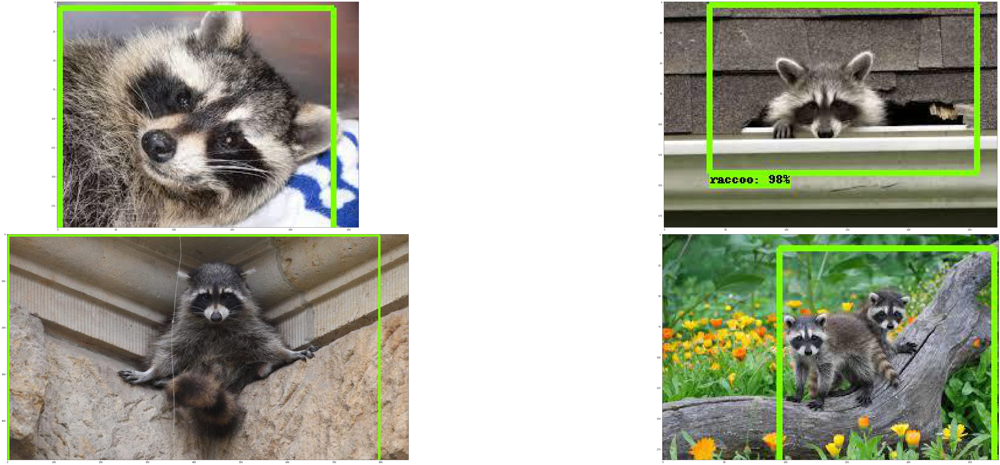

In [46]:
# Visualizing the sample images.
OUTPUT_PATH = 'annotated_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 2 # number of columns in the visualizer grid.
IMAGES = 4 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 10. Deploy! <a class="anchor" id="head-10"></a>

In [47]:
# Export in FP32 mode. 
!mkdir -p $LOCAL_EXPERIMENT_DIR/export
!tao efficientdet export -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.tlt \
                         -o $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.etlt \
                         -k $KEY \
                         -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                         --data_type fp32 \
                         --engine_file $USER_EXPERIMENT_DIR/export/model.step-$NUM_STEP.engine

2022-01-04 10:39:45,569 [INFO] root: Registry: ['nvcr.io']
2022-01-04 10:39:45,606 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-04 10:39:45,625 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/numba/cuda/envvars.py:17: NumbaWarning: 
Environment variables with the 'NUMBAPRO' prefix are deprecated and consequently ignored, found use of NUMBAPRO_NVVM=/usr/local/cuda/nvvm/lib64/libnvvm.so.

For more information about alternatives visit: ('http://numba.pydata.org/numba-doc/latest/cuda/overview.html', '#cudatoolkit-lookup')
  

2022-01-04 10:42:23,585 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [48]:
# Export in INT8 mode. 
!mkdir -p $LOCAL_EXPERIMENT_DIR/export_int8
# Uncomment to remove existing etlt file
# !rm $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain/model.step-0.etlt
!tao efficientdet export -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.tlt \
                         -o $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.etlt \
                         -k $KEY \
                         -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                         --batch_size 8 \
                         --data_type int8 \
                         --cal_image_dir $DATA_DOWNLOAD_DIR/raw-data/val2017 \
                         --batches 10 \
                         --max_batch_size 1 \
                         --cal_cache_file $USER_EXPERIMENT_DIR/export/efficientdet_d0.cal

2022-01-04 10:42:34,450 [INFO] root: Registry: ['nvcr.io']
2022-01-04 10:42:34,487 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-04 10:42:34,506 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/numba/cuda/envvars.py:17: NumbaWarning: 
Environment variables with the 'NUMBAPRO' prefix are deprecated and consequently ignored, found use of NUMBAPRO_NVVM=/usr/local/cuda/nvvm/lib64/libnvvm.so.

For more information about alternatives visit: ('http://numba.pydata.org/numba-doc/latest/cuda/overview.html', '#cudatoolkit-lookup')
  

In [49]:
# Check if etlt model is correctly saved.
!ls -l $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain/

total 1171748
-rw-r--r-- 1 root root 75239209  1월  4 10:34 events.out.tfevents.1641256219.4670747ba064
-rw-r--r-- 1 root root 38131990  1월  4 09:30 graph.pbtxt
-rw-r--r-- 1 root root   688784  1월  4 10:34 log.json
-rw-r--r-- 1 root root 66878862  1월  4 09:30 model.step-0.tlt
-rw-r--r-- 1 root root 66878937  1월  4 09:56 model.step-11022.tlt
-rw-r--r-- 1 root root 66878937  1월  4 10:00 model.step-12859.tlt
-rw-r--r-- 1 root root 66878938  1월  4 10:04 model.step-14696.tlt
-rw-r--r-- 1 root root 66878938  1월  4 10:09 model.step-16533.tlt
-rw-r--r-- 1 root root 66878937  1월  4 10:13 model.step-18370.tlt
-rw-r--r-- 1 root root 66878946  1월  4 09:34 model.step-1837.tlt
-rw-r--r-- 1 root root 66878937  1월  4 10:17 model.step-20207.tlt
-rw-r--r-- 1 root root 66878937  1월  4 10:21 model.step-22044.tlt
-rw-r--r-- 1 root root 66878981  1월  4 10:25 model.step-23881.tlt
-rw-r--r-- 1 root root 66878982  1월  4 10:30 model.step-25718.tlt
-rw-r--r-- 1 root root 15677220  1월  4 10:40 model.step-27555.etl

Verify engine generation using the `tao-converter` utility included with the docker.

The `tao-converter` produces optimized tensorrt engines for the platform that it resides on. Therefore, to get maximum performance, please instantiate this docker and execute the `tao-converter` command, with the exported `.etlt` file and calibration cache (for int8 mode) on your target device. The tao-converter utility included in this docker only works for x86 devices, with discrete NVIDIA GPU's. 

For the jetson devices, please download the tao-converter for jetson from the dev zone link [here](https://developer.nvidia.com/tao-converter). 

If you choose to integrate your model into deepstream directly, you may do so by simply copying the exported `.etlt` file along with the calibration cache to the target device and updating the spec file that configures the `gst-nvinfer` element to point to this newly exported model. Please refer to [deepstream dev guide](https://docs.nvidia.com/metropolis/deepstream/dev-guide/index.html) for more details.

In [50]:
print('Exported model:')
print('------------')
!ls -lth $LOCAL_EXPERIMENT_DIR/export

Exported model:
------------
total 26M
-rw-r--r-- 1 root root 26M  1월  4 10:42 model.step-27555.engine


In [51]:
# Convert to TensorRT engine(FP16).
!tao converter -k $KEY  \
                -p image_arrays:0,1x512x512x3,8x512x512x3,16x512x512x3 \
                -e $USER_EXPERIMENT_DIR/export/trt.fp16.engine \
                -t fp16 \
                $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.etlt

2022-01-04 10:42:51,491 [INFO] root: Registry: ['nvcr.io']
2022-01-04 10:42:51,527 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-04 10:42:51,545 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
[INFO] [MemUsageChange] Init CUDA: CPU +330, GPU +0, now: CPU 336, GPU 862 (MiB)
[INFO] ----------------------------------------------------------------
[INFO] Input filename:   /tmp/filetCYrv3
[INFO] ONNX IR version:  0.0.7
[INFO] Opset version:    13
[INFO] Producer name:    
[INFO] Producer version: 
[INFO] Domain:           
[INFO] Model version:    0
[INFO] Doc string:       
[INFO] --------

In [52]:
# Convert to TensorRT engine(INT8).
!tao converter -k $KEY  \
               -c $USER_EXPERIMENT_DIR/export/trt.int8.cal \
               -p image_arrays:0,1x512x512x3,8x512x512x3,16x512x512x3 \
               -e $USER_EXPERIMENT_DIR/export/trt.int8.engine \
               -t int8 \
               -b 8 \
               $USER_EXPERIMENT_DIR/experiment_dir_retrain/model.step-$NUM_STEP.etlt

2022-01-04 10:52:17,269 [INFO] root: Registry: ['nvcr.io']
2022-01-04 10:52:17,308 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-04 10:52:17,327 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
[INFO] [MemUsageChange] Init CUDA: CPU +332, GPU +0, now: CPU 338, GPU 1027 (MiB)
[INFO] ----------------------------------------------------------------
[INFO] Input filename:   /tmp/fileg41eoE
[INFO] ONNX IR version:  0.0.7
[INFO] Opset version:    13
[INFO] Producer name:    
[INFO] Producer version: 
[INFO] Domain:           
[INFO] Model version:    0
[INFO] Doc string:       
[INFO] -------

In [53]:
print('Exported engine:')
print('------------')
!ls -lh $LOCAL_EXPERIMENT_DIR/export/

Exported engine:
------------
total 45M
-rw-r--r-- 1 root root 26M  1월  4 10:42 model.step-27555.engine
-rw-r--r-- 1 root root 19M  1월  4 10:52 trt.fp16.engine


## 11. Verify the deployed model <a class="anchor" id="head-11"></a>

Verify the converted engine by visualizing TensorRT inferences.

In [54]:
# Running inference for detection on a dir of images
!tao efficientdet inference -i $DATA_DOWNLOAD_DIR/raw-data/test \
                         -o $USER_EXPERIMENT_DIR/trt_annotated_images \
                         -e $SPECS_DIR/efficientdet_d0_retrain.txt \
                         -m $USER_EXPERIMENT_DIR/export/model.step-$NUM_STEP.engine \
                         -l $USER_EXPERIMENT_DIR/trt_annotated_labels \
                         --label_map $SPECS_DIR/coco_labels.txt

2022-01-04 10:52:31,740 [INFO] root: Registry: ['nvcr.io']
2022-01-04 10:52:31,779 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.5-py3
2022-01-04 10:52:31,799 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
Loading experiment spec at %s. /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_retrain.txt
2022-01-04 01:52:36,921 [INFO] iva.efficientdet.utils.spec_loader: Merging specification from /workspace/tao-experiments/my_tao_cv_sample/myRaccoon/specs/efficientdet_d0_retrain.txt
Finished Processing / 17
Exception ignored in:

In [55]:
!ls -l $LOCAL_EXPERIMENT_DIR/trt_annotated_images

total 4956
-rw-r--r-- 1 root root 478474  1월  4 10:52 raccoon-57_jpg.rf.9a1351ac4447ff21d4390fd8e323e7bf.png
-rw-r--r-- 1 root root  80518  1월  4 10:52 raccoon-58_jpg.rf.d06ce184082977965e0659f0444ed3c9.png
-rw-r--r-- 1 root root 485409  1월  4 10:52 raccoon-59_jpg.rf.079100ee6a52181388c3677744a5c16a.png
-rw-r--r-- 1 root root  55272  1월  4 10:52 raccoon-60_jpg.rf.ee59d00b346bda9929f905defbf367ee.png
-rw-r--r-- 1 root root 109909  1월  4 10:52 raccoon-61_jpg.rf.3b2ab56ca1eccdae9144b40b65e0e23b.png
-rw-r--r-- 1 root root 424763  1월  4 10:52 raccoon-62_jpg.rf.a055b6e5102faea5fa404472bbc7a5fc.png
-rw-r--r-- 1 root root 530701  1월  4 10:52 raccoon-63_jpg.rf.ee21dbec555f80345f8537eac0e37c3d.png
-rw-r--r-- 1 root root  92913  1월  4 10:52 raccoon-64_jpg.rf.47ce5bdc84c74f8c705fd2c74aede4b2.png
-rw-r--r-- 1 root root 609705  1월  4 10:52 raccoon-66_jpg.rf.10d9d5caae920c4440eb3dafad353391.png
-rw-r--r-- 1 root root 114485  1월  4 10:52 raccoon-67_jpg.rf.0a88464512e6367068c9fa4c239fe2b4.png
-rw-r--r-

In [56]:
# Simple grid visualizer
!pip3 install matplotlib==3.3.3
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.png']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['LOCAL_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


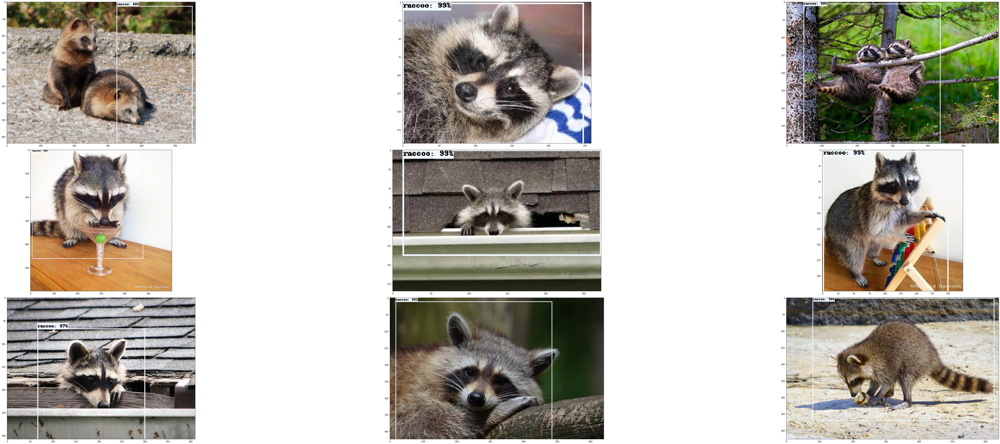

In [57]:
# Visualizing the sample images.
OUTPUT_PATH = 'trt_annotated_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 3 # number of columns in the visualizer grid.
IMAGES = 9 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)